# Notebook for the integration and pathway analysis of the VAE


In [2]:
import pandas as pd
import pandas as pd
from collections import defaultdict
import seaborn as sns
import numpy as np
from scivae import VAE
import warnings

warnings.filterwarnings("ignore")

base_dir = '../data/'
data_dir = f'{base_dir}sircle/F6_integrative_comparisons/'
output_dir = f'{base_dir}sircle/F6_integrative_comparisons/'
input_data_dir = f'{base_dir}sircle/F1_DE_input_TvN/'

fig_dir = '../figures/'
supp_dir = f'{base_dir}raw_downloads/supps/'
gene_name = 'hgnc_symbol'
save_fig = False
test_title = 'all_patients_ccRCC'

stats_base_dir = f'{output_dir}'
stats_stats_dir = f'{output_dir}'
stats_output_dir = f'{output_dir}'
stats_fig_dir = fig_dir
stats_vae_dir = f'{output_dir}VAE_configs/'

# Read in the data
stats_data_dir = data_dir

## Load sample files and data, save input files 

In [3]:
gene_id = 'ensembl_gene_id'
# Load in the files that we used for DE analysis and remove any redundent columns
# the VAE excpets just the ID as the index, and then the values
rna_sample_file = f'{input_data_dir}rna_sample_df_sircle_ccRCC.csv'
prot_sample_file = f'{input_data_dir}prot_sample_data_sircle_ccRCC.csv'
# Now we want to merge the clinical info with the cases from the sample df
meth_sample_file = f'{input_data_dir}cpg_sample_data_all_patients_ccRCC_sircle.csv'
tcga_cptac_clin = f'{input_data_dir}clinical_CPTAC_TCGA.csv'

rna_samples = list(pd.read_csv(rna_sample_file)['FullLabel'].values)
prot_samples = list(pd.read_csv(prot_sample_file)['FullLabel'].values)
meth_samples = list(pd.read_csv(meth_sample_file)['FullLabel'].values)
# Only use the filtered i.e. one CpG to one gene mapping for the cpg data
cpg_data_df = pd.read_csv(f'{base_dir}sircle/F2_DE_output_TvN/filtered_cpg_DE_all_patients_ccRCC_sircle.csv')
# Use this one as it has tmm normalised RNA 
rna_data_df = pd.read_csv(f'{base_dir}sircle/F2_DE_output_TvN/rna_DE_all_patients_ccRCC_sircle.csv')
prot_data_df = pd.read_csv(f'{base_dir}sircle/F2_DE_output_TvN/prot_DE_all_patients_ccRCC_sircle.csv')

cpg_data_df = cpg_data_df[[gene_id] + meth_samples]
rna_data_df = rna_data_df[[gene_id] + rna_samples]
protein_data_df = prot_data_df[[gene_id] + prot_samples]

rcm_df = pd.read_csv(f'{base_dir}sircle/F3_regulatory_clustering/RCM_all_patients_ccRCC_P0.5-R1.0-M0.1-GENES.csv')
# First filter out any NA values (we're not interested in non SiRCle genes)
rcm_df = rcm_df[rcm_df['Regulation_Grouping_2'] != 'None']

meta_cols = [gene_id, 'external_gene_name', 'entrezgene_id', 'hgnc_symbol', "logFC_rna", "padj_rna", 
             "CpG_Beta_diff", "padj_meth", "logFC_protein", "padj_protein", "Regulation_Grouping_2"]


# Save to input dir
save_input_data = False
meta_rcm_df = rcm_df[meta_cols].copy()
meta_rcm_df.set_index('ensembl_gene_id', inplace=True)
# Save to the input data dir folder.
if save_input_data:
    protein_data_df.to_csv(f'{stats_data_dir}CPTAC_protein.csv', index=False)
    rna_data_df.to_csv(f'{stats_data_dir}CPTAC_rna.csv', index=False)
    cpg_data_df.to_csv(f'{stats_data_dir}CPTAC_cpg.csv', index=False)
    meta_rcm_df.to_csv(f'{stats_data_dir}RCM.csv')

## Run Integration

In [4]:
from scircm import RCMStats
missing_method='mean'
label = missing_method
sv = RCMStats(rcm_file=f'{stats_data_dir}RCM.csv', 
              patient_sample_file=tcga_cptac_clin,
              meth_file=f'{stats_data_dir}CPTAC_cpg.csv', 
              meth_sample_file=meth_sample_file, 
              rna_file=f'{stats_data_dir}CPTAC_rna.csv', 
              rna_sample_file=rna_sample_file,
              protein_file=f'{stats_data_dir}CPTAC_protein.csv', 
              protein_sample_file=prot_sample_file,
              output_folder=stats_vae_dir, 
              column_id='FullLabel',
              condition_column='CondId',
              patient_id_column='SafeCases',
              run_name=label,
              normalise='rows', 
              verbose=True,
             missing_method=missing_method)


--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Overlap between SiRCLe gene clusters and protein, RNA, and CpG: 	2788	
	If you used SiRCLe, this should be the total number of genes in your SiRCLe dataset. 6718	
 First 5 gene IDs in RCM: 	['ENSG00000034971', 'ENSG00000138944', 'ENSG00000145192', 'ENSG00000015413', 'ENSG00000265206']	
 First 5 gene IDs in Protein: 	[nan, 'ENSG00000034971', 'ENSG00000145192', 'ENSG00000015413', 'ENSG00000105472']	
 First 5 gene IDs in RNA: 	['ENSG00000138944', 'ENSG00000105369', 'ENSG00000240751', 'ENSG00000141642', 'ENSG00000213987']	
 First 5 gene IDs in Methylation: 	['ENSG00000138944', 'ENSG00000105369', 'ENSG00000172900', 'ENSG00000141642', 'ENSG00000100393']	
--------------------------------------------------------------------------------
-------------------

## Look at the missing vs matched data

In [5]:
# Get the patient info that has been compiled from the provided sample files
patient_info = sv.patient_clinical_df
# Select the cases with 5 samples 
matching_patient_info = patient_info[patient_info['Sample counts'] == 5]
matching_cases = matching_patient_info['SafeCases'].values
print("total number of patients: ", len(patient_info), " vs number with matching data: ", len(matching_patient_info))
matching_cases

total number of patients:  261  vs number with matching data:  59


array(['C3L.00004', 'C3L.00010', 'C3L.00011', 'C3L.00026', 'C3L.00079',
       'C3L.00088', 'C3L.00096', 'C3L.00097', 'C3L.00103', 'C3L.00360',
       'C3L.00369', 'C3L.00416', 'C3L.00418', 'C3L.00447', 'C3L.00581',
       'C3L.00606', 'C3L.00814', 'C3L.00902', 'C3L.00907', 'C3L.00908',
       'C3L.00910', 'C3L.00917', 'C3L.01286', 'C3L.01287', 'C3L.01313',
       'C3L.01603', 'C3L.01607', 'C3L.01836', 'C3N.00148', 'C3N.00149',
       'C3N.00150', 'C3N.00177', 'C3N.00194', 'C3N.00244', 'C3N.00310',
       'C3N.00314', 'C3N.00390', 'C3N.00494', 'C3N.00495', 'C3N.00573',
       'C3N.00577', 'C3N.00646', 'C3N.00733', 'C3N.00831', 'C3N.00834',
       'C3N.00852', 'C3N.01176', 'C3N.01178', 'C3N.01179', 'C3N.01200',
       'C3N.01214', 'C3N.01220', 'C3N.01261', 'C3N.01361', 'C3N.01522',
       'C3N.01646', 'C3N.01649', 'C3N.01651', 'C3N.01808'], dtype=object)

## Ensure that the old people aren't all stage 4 

Plot demographics for the input data

In [6]:
cptac = patient_info[~patient_info['case_id'].isnull()]
old = cptac[cptac['AgeGrouped'] == 'old']
young = cptac[cptac['AgeGrouped'] == 'young']
# Now do the number / percent stage 1 and stage 4
s4 = old[old['TumorStage'] == 'Stage IV']
s2 = old[old['TumorStage'] == 'Stage II']
s3 = old[old['TumorStage'] == 'Stage III']
s1 = old[old['TumorStage'] == 'Stage I']
print(len(s1), len(s2), len(s3), len(s4))
print(len(s1)/len(old), len(s2)/len(old), len(s3)/len(old), len(s4)/len(old))

# Now do the number / percent stage 1 and stage 4
s4 = young[young['TumorStage'] == 'Stage IV']
s2 = young[young['TumorStage'] == 'Stage II']
s3 = young[young['TumorStage'] == 'Stage III']
s1 = young[young['TumorStage'] == 'Stage I']
print(len(s1), len(s2), len(s3), len(s4))
print(len(s1)/len(young), len(s2)/len(young), len(s3)/len(young), len(s4)/len(young))

27 9 24 6
0.4090909090909091 0.13636363636363635 0.36363636363636365 0.09090909090909091
7 1 1 0
0.7777777777777778 0.1111111111111111 0.1111111111111111 0.0


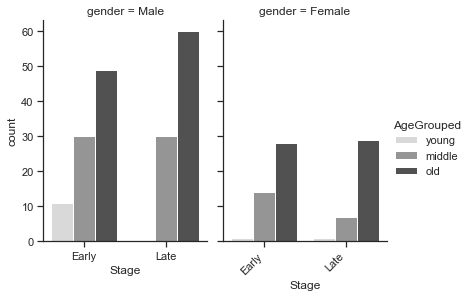

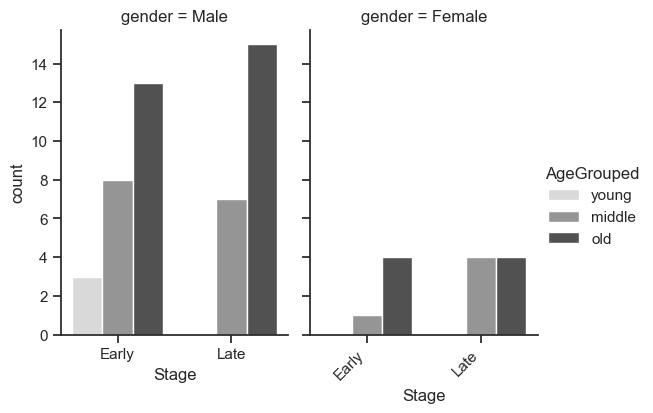

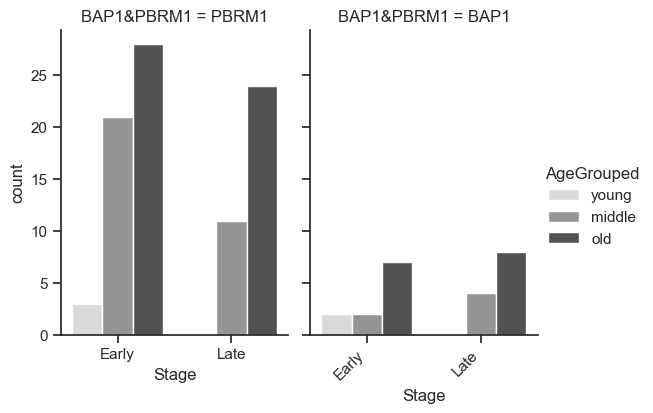

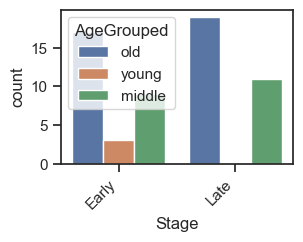

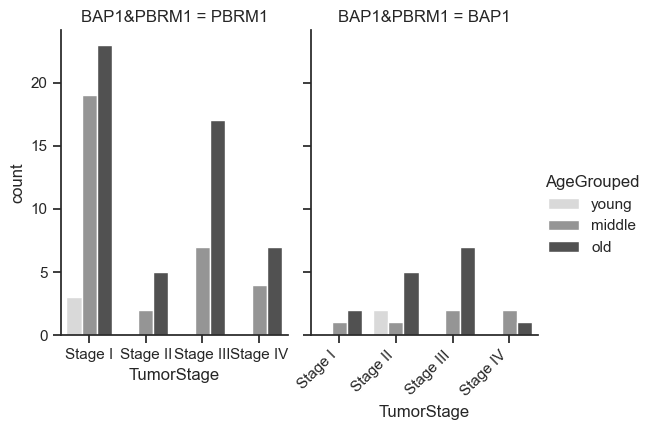

In [7]:
import matplotlib.pyplot as plt

palette = ['#483873', '#1BD8A6', '#B117B7', '#AAC7E2', '#FFC107', '#016957', '#9785C0',
     '#D09139', '#338A03', '#FF69A1', '#5930B1', '#FFE884', '#35B567', '#1E88E5',
     '#ACAD60', '#A2FFB4', '#B618F5', '#854A9C']
plt.rcParams['svg.fonttype'] = 'none'  # Ensure text is saved as text
plt.rcParams['figure.figsize'] = (3, 2)
sns.set(rc={'figure.figsize': (3, 2), 'font.family': 'sans-serif',
            'font.sans-serif': 'Arial', 'font.size': 9}, style='ticks')

g = sns.catplot(x="Stage", hue="AgeGrouped", col="gender",
                order=['Early', 'Late'],
                data=patient_info, kind="count", palette='Greys', hue_order=['young', 'middle', 'old'],
                height=4, aspect=.7)
plt.xticks(rotation=45, ha='right')
plt.savefig(f'{stats_fig_dir}patient_demographics_all.svg')
plt.show()

g = sns.catplot(x="Stage", hue="AgeGrouped", col="gender",
                order=['Early', 'Late'],
                data=matching_patient_info, kind="count", palette='Greys', hue_order=['young', 'middle', 'old'],
                height=4, aspect=.7)
plt.xticks(rotation=45, ha='right')
plt.savefig(f'{stats_fig_dir}patient_demographics_matched.svg')
plt.show()

g = sns.catplot(x="Stage", hue="AgeGrouped", col="BAP1&PBRM1",
                order=['Early', 'Late'],
                data=patient_info, kind="count", palette='Greys', hue_order=['young', 'middle', 'old'],
                height=4, aspect=.7)
plt.xticks(rotation=45, ha='right')
plt.savefig(f'{stats_fig_dir}patient_demographics_BAP1&PBRM1_all.svg')
plt.show()

g = sns.countplot(x="Stage", hue="AgeGrouped",
                order=['Early', 'Late'],
                data=matching_patient_info)
plt.xticks(rotation=45, ha='right')


g = sns.catplot(x="TumorStage", hue="AgeGrouped", col="BAP1&PBRM1", hue_order=['young', 'middle', 'old'],
                data=patient_info, kind="count", palette='Greys', order=['Stage I', 'Stage II', 'Stage III', 'Stage IV'],
                height=4, aspect=.7)
plt.xticks(rotation=45, ha='right')
plt.savefig(f'{stats_fig_dir}patient_demographics_BAP1&PBRM1.svg')
plt.show()

## Train integration model (VAE)

In [8]:
train = False
if train:
    epochs = 100 
    batch_size = 16
    num_nodes = 5
    mmd_weight = 0.25
    loss = {'loss_type': 'mse', 'distance_metric': 'mmd', 'mmd_weight': mmd_weight}
    config = {"loss": loss,
              "encoding": {"layers": [{"num_nodes": num_nodes, "activation_fn": "relu"}]},
              "decoding": {"layers": [{"num_nodes": num_nodes, "activation_fn": "relu"}]},
              "latent": {"num_nodes": 1},
              "optimiser": {"params": {'learning_rate': 0.01}, "name": "adam"},
              "epochs": epochs,
              "batch_size": batch_size,
              "scale_data": False
              }
    training_cases = matching_cases # Use matching cases for training
    sv.train_vae(cases=matching_cases, config=config)
    sv.save()  # Save the information we have generated.
else:
    sv.load_saved_vaes()
    sv.load_saved_encodings(f'{sv.output_folder}encoded_df_{label}.csv')
    sv.load_saved_inputs(f'{sv.output_folder}vae_input_df_{label}.csv')
    sv.load_saved_raws(f'{sv.output_folder}raw_input_df_{label}.csv')

7
--------------------------------------------------------------------------------
                               Encoder summary:	                                
--------------------------------------------------------------------------------
Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 default_input (InputLayer)     [(None, 7)]          0           []                               
                                                                                                  
 dense (Dense)                  (None, 5)            40          ['default_input[0][0]']          
                                                                                                  
 z_mean (Dense)                 (None, 1)            6           ['dense[0][0]']                  
                                             

2022-06-09 14:55:50.367413: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


7
--------------------------------------------------------------------------------
                               Encoder summary:	                                
--------------------------------------------------------------------------------
Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 default_input (InputLayer)     [(None, 7)]          0           []                               
                                                                                                  
 dense_3 (Dense)                (None, 5)            40          ['default_input[0][0]']          
                                                                                                  
 z_mean (Dense)                 (None, 1)            6           ['dense_3[0][0]']                
                                             

_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 z_sampling (InputLayer)     [(None, 1)]               0         
                                                                 
 dense_10 (Dense)            (None, 5)                 10        
                                                                 
 dense_11 (Dense)            (None, 7)                 42        
                                                                 
Total params: 52
Trainable params: 52
Non-trainable params: 0
_________________________________________________________________
None
7
--------------------------------------------------------------------------------
                               Encoder summary:	                                
--------------------------------------------------------------------------------
Model: "encoder"
_____________________________________________________________________________

 z (Lambda)                     (None, 1)            0           ['z_mean[0][0]',                 
                                                                  'z_log_sigma[0][0]']            
                                                                                                  
Total params: 52
Trainable params: 52
Non-trainable params: 0
__________________________________________________________________________________________________
None
--------------------------------------------------------------------------------
                               Decoder summary:	                                
--------------------------------------------------------------------------------
Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 z_sampling (InputLayer)     [(None, 1)]               0         
                                                                 
 dense_19 (De

 default_input (InputLayer)     [(None, 7)]          0           []                               
                                                                                                  
 dense_27 (Dense)               (None, 5)            40          ['default_input[0][0]']          
                                                                                                  
 z_mean (Dense)                 (None, 1)            6           ['dense_27[0][0]']               
                                                                                                  
 z_log_sigma (Dense)            (None, 1)            6           ['dense_27[0][0]']               
                                                                                                  
 z (Lambda)                     (None, 1)            0           ['z_mean[0][0]',                 
                                                                  'z_log_sigma[0][0]']            
          

## Run stats on different comparisons!

In [9]:
from sciutil import SciUtil
u = SciUtil()
u.warn_p(['AgeGrouped'])
sv.run_vae_stats(cond_label='AgeGrouped', cond0='young', cond1='old')

u.warn_p(['Mutation'])
sv.run_vae_stats(cond_label='BAP1&PBRM1', cond0='BAP1', cond1='PBRM1')

u.warn_p(['S4 vs S1'])
sv.run_vae_stats(cond_label='TumorStage', cond0='Stage I', cond1='Stage IV')


--------------------------------------------------------------------------------
                                  AgeGrouped	                                   
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Summary
	Cond1: 56 vs Cond0: 8
	       mannwhitneyu stat (old-young)  Integrated padj (old-young)  \
count                    1420.000000                  1420.000000   
mean                      222.261972                     0.933186   
std                        51.317501                     0.068463   
min                        79.000000                     0.639473   
25%                       188.000000                     0.893602   
50%                       223.000000                     0.954762   
75%                       258.250000                     0.986121   
max                       372.000000                     1.000000   

       Integrated pval

--------------------------------------------------------------------------------
Summary
	Cond1: 56 vs Cond0: 8
	       mannwhitneyu stat (old-young)  Integrated padj (old-young)  \
count                     539.000000                   539.000000   
mean                      250.530612                     0.683886   
std                        54.735597                     0.172350   
min                        81.000000                     0.396896   
25%                       208.000000                     0.551028   
50%                       257.000000                     0.681829   
75%                       291.500000                     0.817606   
max                       368.000000                     1.000000   

       Integrated pval (old-young)  Integrated diff (old-young)  \
count                   539.000000                   539.000000   
mean                      0.395653                     0.173275   
std                       0.289174                     0.392225 

--------------------------------------------------------------------------------
Summary
	Cond1: 56 vs Cond0: 8
	       mannwhitneyu stat (old-young)  Integrated padj (old-young)  \
count                     463.000000                   463.000000   
mean                      201.786177                     0.732877   
std                        57.136122                     0.231689   
min                        57.000000                     0.099678   
25%                       163.000000                     0.630263   
50%                       201.000000                     0.804586   
75%                       242.000000                     0.919029   
max                       359.000000                     1.000000   

       Integrated pval (old-young)  Integrated diff (old-young)  \
count                   463.000000                   463.000000   
mean                      0.433959                    -0.119217   
std                       0.305587                     0.233224 

--------------------------------------------------------------------------------
Summary
	Cond1: 33 vs Cond0: 13
	       mannwhitneyu stat (PBRM1-BAP1)  Integrated padj (PBRM1-BAP1)  \
count                      803.000000                    803.000000   
mean                       201.438356                      0.508041   
std                         64.853256                      0.310917   
min                         12.000000                      0.000667   
25%                        155.000000                      0.237425   
50%                        200.000000                      0.497520   
75%                        246.000000                      0.807558   
max                        377.000000                      1.000000   

       Integrated pval (PBRM1-BAP1)  Integrated diff (PBRM1-BAP1)  \
count                  8.030000e+02                    803.000000   
mean                   3.463774e-01                     -0.035353   
std                    3.134513e-01    

--------------------------------------------------------------------------------
Summary
	Cond1: 33 vs Cond0: 13
	       mannwhitneyu stat (PBRM1-BAP1)  Integrated padj (PBRM1-BAP1)  \
count                     1308.000000                   1308.000000   
mean                       224.196483                      0.467611   
std                         67.826585                      0.306078   
min                         36.000000                      0.000616   
25%                        176.000000                      0.198455   
50%                        228.000000                      0.421708   
75%                        275.000000                      0.743527   
max                        417.000000                      1.000000   

       Integrated pval (PBRM1-BAP1)  Integrated diff (PBRM1-BAP1)  \
count                  1.308000e+03                   1308.000000   
mean                   3.240647e-01                      0.029891   
std                    3.087643e-01    

--------------------------------------------------------------------------------
Summary
	Cond1: 10 vs Cond0: 45
	       mannwhitneyu stat (Stage IV-Stage I)  \
count                           1069.000000   
mean                             233.931712   
std                               76.340149   
min                               48.000000   
25%                              175.000000   
50%                              235.000000   
75%                              290.000000   
max                              434.000000   

       Integrated padj (Stage IV-Stage I)  Integrated pval (Stage IV-Stage I)  \
count                         1069.000000                         1069.000000   
mean                             0.456846                            0.319378   
std                              0.309729                            0.307709   
min                              0.005739                            0.000005   
25%                              0.164804                

--------------------------------------------------------------------------------
Summary
	Cond1: 10 vs Cond0: 45
	       mannwhitneyu stat (Stage IV-Stage I)  \
count                            415.000000   
mean                             242.698795   
std                               68.073691   
min                               48.000000   
25%                              203.000000   
50%                              242.000000   
75%                              295.500000   
max                              396.000000   

       Integrated padj (Stage IV-Stage I)  Integrated pval (Stage IV-Stage I)  \
count                          415.000000                          415.000000   
mean                             0.557452                            0.375550   
std                              0.327268                            0.328739   
min                              0.033074                            0.000117   
25%                              0.250505                

--------------------------------------------------------------------------------
Summary
	Cond1: 10 vs Cond0: 45
	       mannwhitneyu stat (Stage IV-Stage I)  \
count                            463.000000   
mean                             188.365011   
std                               70.457923   
min                                9.000000   
25%                              135.000000   
50%                              186.000000   
75%                              238.500000   
max                              398.000000   

       Integrated padj (Stage IV-Stage I)  Integrated pval (Stage IV-Stage I)  \
count                          463.000000                          463.000000   
mean                             0.431394                            0.306698   
std                              0.310910                            0.303573   
min                              0.001189                            0.000003   
25%                              0.148533                

,id,mannwhitneyu stat (Stage IV-Stage I),Integrated padj (Stage IV-Stage I),Integrated pval (Stage IV-Stage I),Integrated diff (Stage IV-Stage I),Integrated mean (Stage I),Integrated mean (Stage IV),Stage I_C3L.01560,Stage I_C3N.00495,Stage I_C3N.01361,...,Regulation_Grouping_2,Protein-LogFC mean (Stage IV),Protein-LogFC mean (Stage I),Protein-LogFC mean (Stage IV-Stage I),RNA-LogFC mean (Stage IV),RNA-LogFC mean (Stage I),RNA-LogFC mean (Stage IV-Stage I),CpG-LogFC mean (Stage IV),CpG-LogFC mean (Stage I),CpG-LogFC mean (Stage IV-Stage I)
0,ENSG00000000005,190.0,0.695429,0.451539,-0.073670,0.125192,0.051522,-0.280617,0.242022,0.332130,...,TPDS_TMDE,0.000000,0.000000,0.000000,-0.821786,-0.617844,-0.203942,-0.434079,-0.305547,-0.128532
1,ENSG00000003096,226.0,0.995501,0.991295,-0.005227,1.350647,1.345420,1.523223,1.341416,1.213819,...,TPDS_TMDE,-0.417617,-0.283684,-0.133933,-2.241165,-2.058036,-0.183129,-0.067677,-0.079235,0.011559
2,ENSG00000004939,119.0,0.142160,0.021324,-0.189416,1.255321,1.065905,1.393205,1.431313,1.368419,...,TPDS_TMDE,1.394054,1.466043,-0.071989,-5.000432,-5.672828,0.672396,-0.141396,-0.121519,-0.019877
3,ENSG00000005001,137.0,0.238975,0.056210,-0.302341,-0.638235,-0.940576,-0.718853,-0.610162,-0.489282,...,TPDS_TMDE,0.000000,0.000000,0.000000,-2.522605,-1.952379,-0.570226,-0.168012,-0.157581,-0.010431
4,ENSG00000006071,256.0,0.733482,0.505689,0.062979,-0.167911,-0.104932,0.110395,-0.986131,0.400863,...,TPDS_TMDE,0.000000,0.000000,0.000000,-0.294600,-0.492712,0.198112,-0.096770,-0.145593,0.048824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
458,ENSG00000273045,339.0,0.078696,0.013258,0.314148,1.160627,1.474775,1.170020,1.695606,0.924395,...,MDS_TMDE,-0.261270,-0.321215,0.059944,-0.859941,-0.989851,0.129910,0.219305,0.150133,0.069172
459,ENSG00000273274,168.0,0.412908,0.217601,-0.280006,0.030177,-0.249829,0.257031,0.113921,0.408350,...,MDS_TMDE,0.000000,0.000000,0.000000,-0.208227,-0.450848,0.242621,0.169898,0.066255,0.103642
460,ENSG00000273328,187.0,0.617099,0.413176,-0.159038,-0.164170,-0.323208,-0.583170,-0.668284,0.389262,...,MDS_TMDE,0.000000,0.000000,0.000000,-0.739841,-0.769299,0.029459,0.232026,0.166405,0.065622
461,ENSG00000277893,201.0,0.769241,0.608083,-0.061593,-0.515018,-0.576611,0.376827,0.258485,0.147032,...,MDS_TMDE,0.000000,0.000000,0.000000,-0.350238,-0.963343,0.613105,0.297978,0.173261,0.124717


## Compile statistics information and compute GSEA for each comparison

In [10]:
import os
from scipy import stats
from tqdm import tqdm
from scipy.stats import combine_pvalues

save_df = True

files = os.listdir(stats_vae_dir)
stats_files = [f for f in files if 'stats' in f]

rcm_labels = ["MDS", "MDS_TMDE", "MDE", "MDE_TMDS", "TMDE", "TMDS", "TPDE", "TPDE_TMDS",  "TPDS", "TPDS_TMDE"]
stats_summary = [] # rows
summary_df = pd.DataFrame(columns=['Regulatory_cluster'])

# Go Through both
comparisons = ['old-young', 'PBRM1-BAP1', 'Stage IV-Stage I']

vae_rcm_df = meta_rcm_df.copy() # Make a copy that we'll add to

for comp in comparisons:
    all_dfs = pd.DataFrame()
    cond0 = comp.split('-')[1]
    cond1 =  comp.split('-')[0]
    tag = f'{cond1}-{cond0}'
    for f in tqdm(stats_files):
        if label in f and cond0 in f and cond1 in f and 'stats' in f:
            df = pd.read_csv(f'{stats_vae_dir}{f}', index_col=0)
            df.set_index('id', inplace=True)
            df_merged = df.join(vae_rcm_df, how='left', lsuffix='_')  # Join to the 
            # Map gene names and move folder
            df_merged = df_merged[['external_gene_name', 
                                   'Regulation_Grouping_2', 
                                   f'Integrated padj ({cond1}-{cond0})',
                                   f'Integrated pval ({cond1}-{cond0})', 
                                   f'Integrated diff ({cond1}-{cond0})', 
                                   f'mannwhitneyu stat ({cond1}-{cond0})',
                                   f'Integrated mean ({cond0})', 
                                   f'Integrated mean ({cond1})',
                                   f'Protein-LogFC mean ({cond1}-{cond0})', 
                                   f'RNA-LogFC mean ({cond1}-{cond0})',
                                   f'CpG-LogFC mean ({cond1}-{cond0})',
                                   'hgnc_symbol',
                                   'entrezgene_id',
                                   'logFC_rna', 
                                   'padj_rna',
                                   'CpG_Beta_diff', 
                                   'padj_meth', 
                                   'logFC_protein', 
                                   'padj_protein']] # Reorder columns
            df_merged.to_csv(f'{stats_output_dir}{missing_method}_Integrated_comparison_{cond1}-{cond0}.csv')
            for c in df_merged.columns:
                if 'Integrated diff' in c or 'Integrated padj' in c or 'mean' in c:
                        vae_rcm_df.loc[df_merged.index.values, c] = df_merged[c].values
                        


100%|█| 8/8 [00:00<00:00, 3
100%|█| 8/8 [00:00<00:00, 3
100%|█| 8/8 [00:00<00:00, 3


## Plot the correlations as a QC to ensure it is logical/interpretable

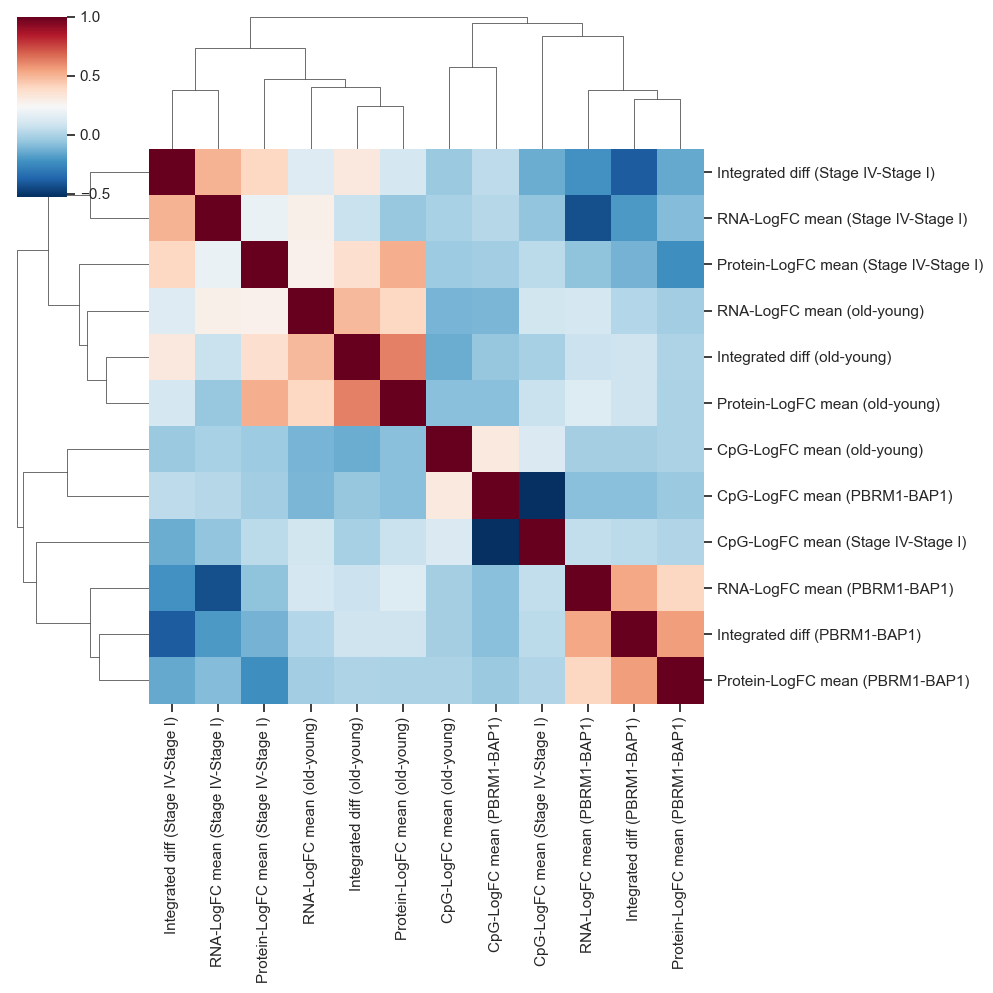

In [11]:
diff_df = vae_rcm_df[[c for c in vae_rcm_df if ' diff' in c or 'LogFC' in c]]
corr = diff_df.corr()
sns.clustermap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values, cmap='RdBu_r', row_cluster=True, col_cluster=True)
if save_fig:
    plt.savefig(f'{stats_fig_dir}{missing_method}_VAE_data_corr.svg', transparent=True)


## Check decoding of some of the top genes

Again, check everything has been learnt "correctly" by ensuring the decoding looks like the input somewhat

MDS 0.0
TPDS 0.0
TMDS 0.037359900373599
MDE 0.0
TPDE 0.019455252918287938
TMDE 0.0
MDS_TMDE 0.0
MDE_TMDS 0.0
TPDE_TMDS 0.0
TPDS_TMDE 0.0


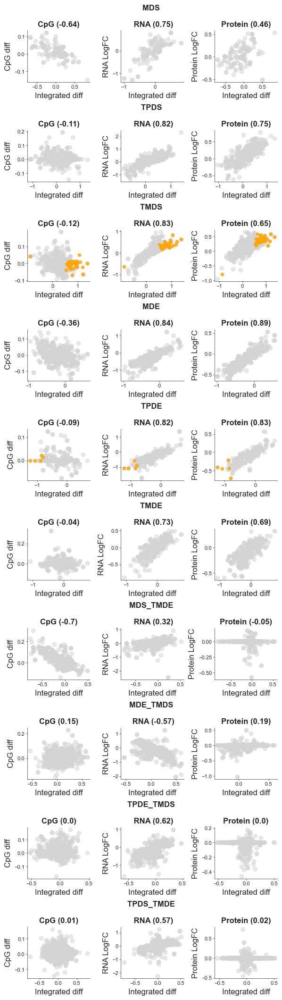

MDS 0.09923664122137404
TPDS 0.09461966604823747
TMDS 0.05977584059775841
MDE 0.04819277108433735
TPDE 0.11673151750972763
TMDE 0.0670926517571885
MDS_TMDE 0.01511879049676026
MDE_TMDS 0.02522935779816514
TPDE_TMDS 0.02432179607109448
TPDS_TMDE 0.015492957746478873


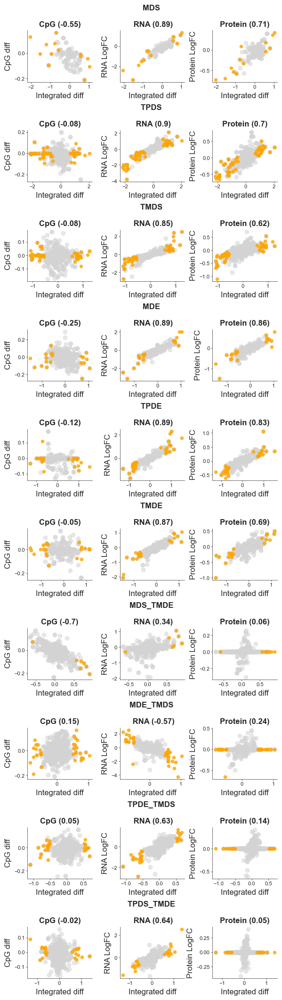

MDS 0.06870229007633588
TPDS 0.10946196660482375
TMDS 0.10585305105853052
MDE 0.05060240963855422
TPDE 0.14396887159533073
TMDE 0.07348242811501597
MDS_TMDE 0.09071274298056156
MDE_TMDS 0.052752293577981654
TPDE_TMDS 0.025257249766136577
TPDS_TMDE 0.03169014084507042


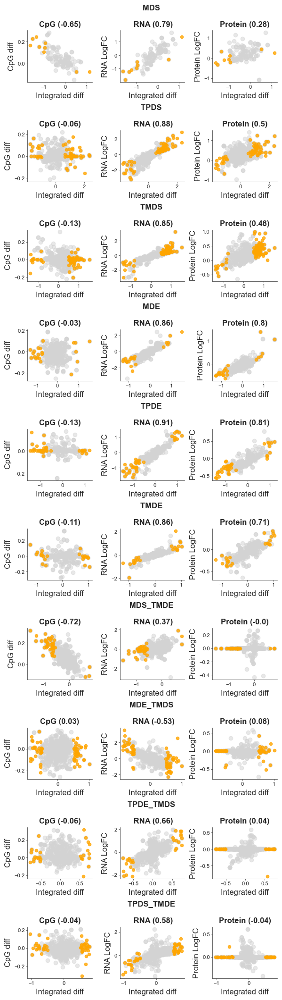

In [12]:
from sciviso import Scatterplot
import matplotlib.pyplot as plt

rcm_labels = ["MDS", "TPDS", "TMDS", 
              "MDE", "TPDE", "TMDE", 
              "MDS_TMDE", "MDE_TMDS", "TPDE_TMDS", "TPDS_TMDE"]

p_cutoff = 0.05

for comparison in comparisons:
    fig, axs = plt.subplots(10, 3, figsize=(6,21))
    vae_change = f'Integrated diff ({comparison})'
    vae_p = f'Integrated padj ({comparison})'

    protein_change = f'Protein-LogFC mean ({comparison})'
    rna_change = f'RNA-LogFC mean ({comparison})'
    cpg_change = f'CpG-LogFC mean ({comparison})'
    
    for fi, r in enumerate(rcm_labels):
        tmp_df = vae_rcm_df[vae_rcm_df['Regulation_Grouping_2'] == r]

        opts = {'title_font_weight': 'bold', "title_font_size":9, "label_font_size":7, "figsize": (6, 9), "s": 20}
        corr_c = round(np.corrcoef(tmp_df[vae_change], tmp_df[cpg_change])[0][1], 2)
        scatter = Scatterplot(tmp_df, vae_change, cpg_change,
                              title_font_weight="bold",
                              colour='orange', config=opts)
        grp_labels = ['Integrated']
        vae_sig = []
        vae_int_change = abs(tmp_df[vae_change].values)
        vae_cutoff = 0.5
        for i, vae_padj in enumerate(tmp_df[vae_p].values):
            if (vae_padj < p_cutoff and vae_int_change[i] > vae_cutoff):
                vae_sig.append(i)
        grp_idxs = [vae_sig]
        print(r, len(vae_sig)/len(tmp_df))
        
        ax = scatter.plot_groups_2D(axs[fi][0], grp_labels, grp_idxs, ['orange'])

        corr_r = round(np.corrcoef(tmp_df[vae_change], tmp_df[rna_change])[0][1], 2)
        scatter = Scatterplot(tmp_df, vae_change, rna_change,  colour='rebeccapurple',
                              xlabel='Integrated Rank (Stage 4 - Stage 1)',
                               config=opts)
        ax = scatter.plot_groups_2D(axs[fi][1], grp_labels, grp_idxs, ['orange', 'rebeccapurple', 'darkred'])

        corr_p = round(np.corrcoef(tmp_df[vae_change], tmp_df[protein_change])[0][1], 2)
        scatter = Scatterplot(tmp_df, vae_change, protein_change, colour='grey',
                             config=opts)
        ax = scatter.plot_groups_2D(axs[fi][2], grp_labels, grp_idxs, ['orange', 'rebeccapurple', 'darkred'])
        plt.tight_layout()

        axs[fi][0].set_title(f'CpG ({corr_c})', fontweight="bold")
        axs[fi][1].set_title(f'{r} \n \n RNA ({corr_r})',  fontweight="bold")
        axs[fi][2].set_title(f'Protein ({corr_p})', fontweight="bold")
        
        axs[fi][0].set(xlabel='Integrated diff', ylabel='CpG diff')
        axs[fi][1].set(xlabel='Integrated diff', ylabel='RNA LogFC')
        axs[fi][2].set(xlabel='Integrated diff', ylabel='Protein LogFC')

    if save_fig:
        plt.savefig(f'{stats_fig_dir}{missing_method}_VAE_data_corr_{comparison}_change.svg', transparent=True)
    plt.show()

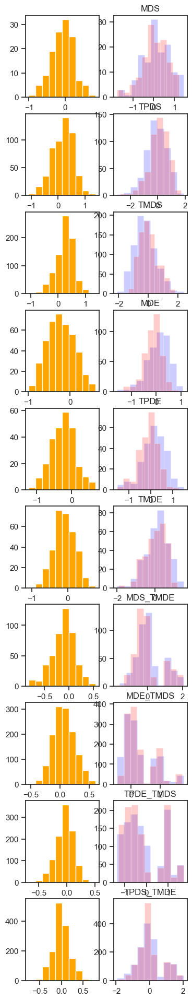

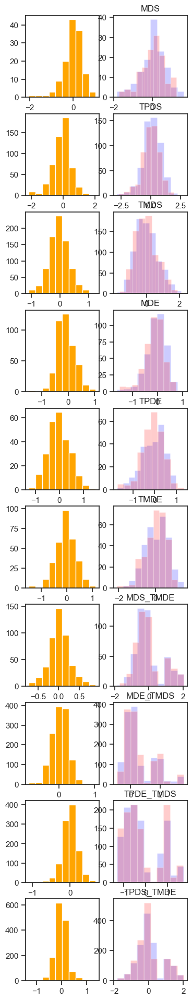

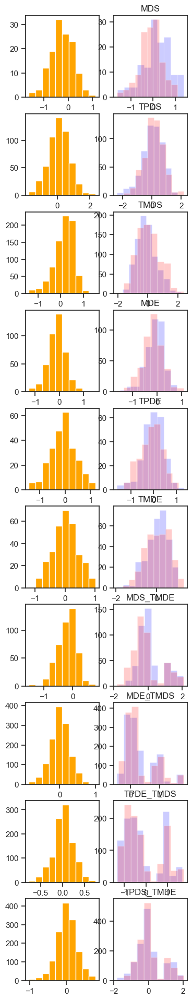

In [13]:
from sciviso import Scatterplot
import matplotlib.pyplot as plt

rcm_labels = ["MDS", "TPDS", "TMDS", 
              "MDE", "TPDE", "TMDE", 
              "MDS_TMDE", "MDE_TMDS", "TPDE_TMDS", "TPDS_TMDE"]

p_cutoff = 0.05

for comparison in comparisons:
    fig, axs = plt.subplots(10, 2, figsize=(4,24))
    cond0 = comparison.split('-')[1]
    cond1 =  comparison.split('-')[0]    
    vae_change = f'Integrated mean ({cond0})'

    for fi, r in enumerate(rcm_labels):
        tmp_df = vae_rcm_df[vae_rcm_df['Regulation_Grouping_2'] == r]

        axs[fi][0].hist(tmp_df[f'Integrated diff ({comparison})'], color='orange')

        axs[fi][1].hist(tmp_df[f'Integrated mean ({cond0})'], color='blue', alpha=0.2)
        axs[fi][1].hist(tmp_df[f'Integrated mean ({cond1})'], color='red', alpha=0.2)
        axs[fi][1].set_title(r)
    if save_fig:
        plt.savefig(f'{stats_fig_dir}{missing_method}_VAE_hists_{comparison}_change.svg', transparent=True)
    plt.show()

In [14]:
# get the gene ids that we're interested in visualising
#from sciviso import Heatmap
import scipy.spatial as sp, scipy.cluster.hierarchy as hc
r = 'MDS'
cond1 = 'Stage IV'
cond0 = 'Stage I'

comparison = f'{cond1}-{cond0}'
vae_diff = f'Integrated diff ({comparison})'
vae_padj = f'Integrated padj ({comparison})'

protein_change = f'Protein-LogFC mean ({comparison})'
rna_change = f'RNA-LogFC mean ({comparison})'
cpg_change = f'CpG-LogFC mean ({comparison})'
    
# Read in the precomputed encoding and decoding dfs
decoding_df = sv.get_decoding(r)
training_df = sv.vae_input_df[r] # Get the input DF

r_df = pd.read_csv(f'{stats_output_dir}{label}_Integrated_comparison_{cond1}-{cond0}.csv')
r_df = r_df[r_df['Regulation_Grouping_2'] == r]

training_df
# Get the highest 5 pvalues as a control
worst_gene_ids = r_df.nlargest(10, vae_padj)['id'].values
row_colours = ['black'] * len(worst_gene_ids)

# Get the nlargest and nsmallest values from the integrated value
r_df = r_df[r_df[vae_padj] <= 0.05]
# Get the top and bottom
r_df = r_df[abs(r_df[vae_diff]) > 0.5]

top_gene_ids = list(r_df[r_df[vae_diff] > 0]['id'].values)
top_gene_ids += list(r_df[r_df[vae_diff] < 0]['id'].values)
gene_colour = {}
for g in list(r_df[r_df[vae_diff] < 0]['id'].values):
    gene_colour[g] = 'purple'
    
for g in list(r_df[r_df[vae_diff] > 0]['id'].values):
    gene_colour[g] = 'yellow'
    
for g in worst_gene_ids:
    gene_colour[g] = 'white'
    
top_gene_ids += list(worst_gene_ids)
# Now we want to plot the top and bottom genes
# Plot genes from both
# Get top genes by encoding
feature_columns = ['Protein', 'RNA', 'CpG'] 
training_df = training_df.join(vae_rcm_df, how='left', lsuffix='_', rsuffix='_r')
plot_df = training_df[training_df.index.isin(top_gene_ids)]  
decoding_df.set_index('id', inplace=True)
# Do the same for decoding
decoding_df = decoding_df.join(vae_rcm_df, how='left', lsuffix='_', rsuffix='_r')
plot_dec_df = decoding_df[decoding_df.index.isin(top_gene_ids)]  

row_colours = []
for g in plot_dec_df.index.values:
    row_colours.append(gene_colour.get(g))
    
fig_size = (8, 10)
vis_opts = {"figsize": fig_size, "title_font_size": 12, "axis_font_size": 10}



5/5 [==============================] - 0s 786us/step


## Validation and supplemental figures.

We want to do some validation and QC plots for each of the comparisons.

1. Correlation heatmap with VAE results and the raw data.   (across all clusters)
2. Correlation scatterplot of the VAE compared with the main logFC. (for specific clusters)
3. boxplots for the top an dbottmo 5 genes within each cluster (coloured by the patient features)

In [14]:
cond0_cases = list(patient_info[patient_info['TumorStage'] == cond0]['SafeCases'].values)
cond1_cases = list(patient_info[patient_info['TumorStage'] == cond1]['SafeCases'].values)

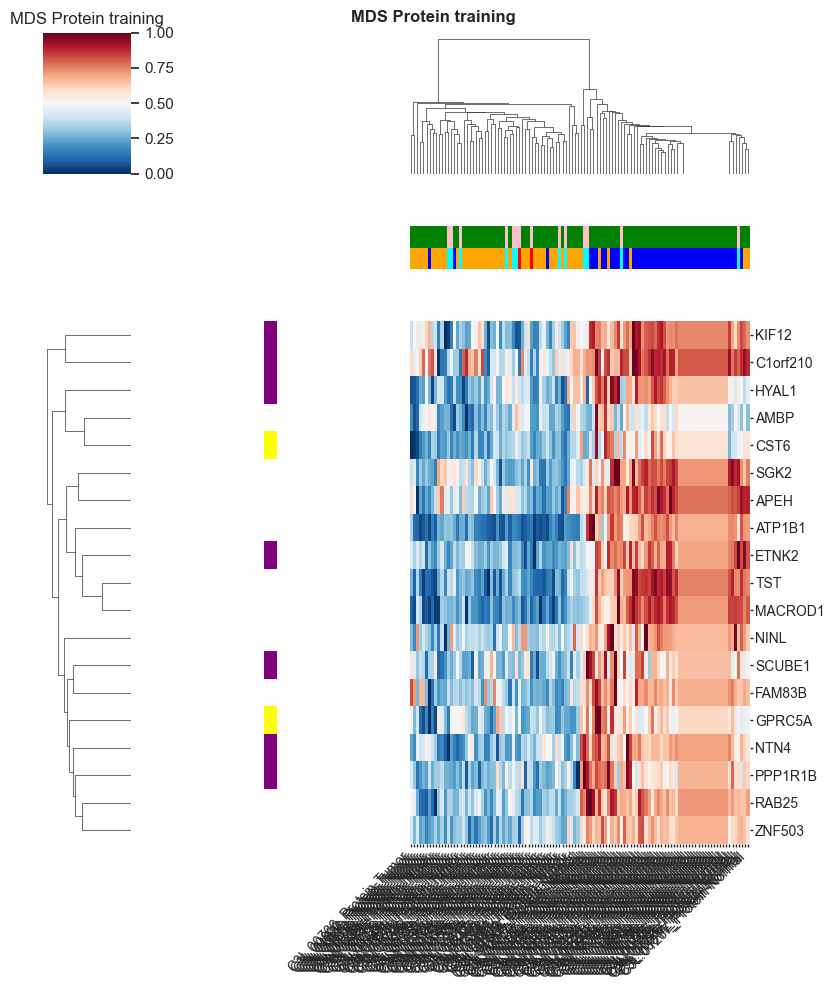

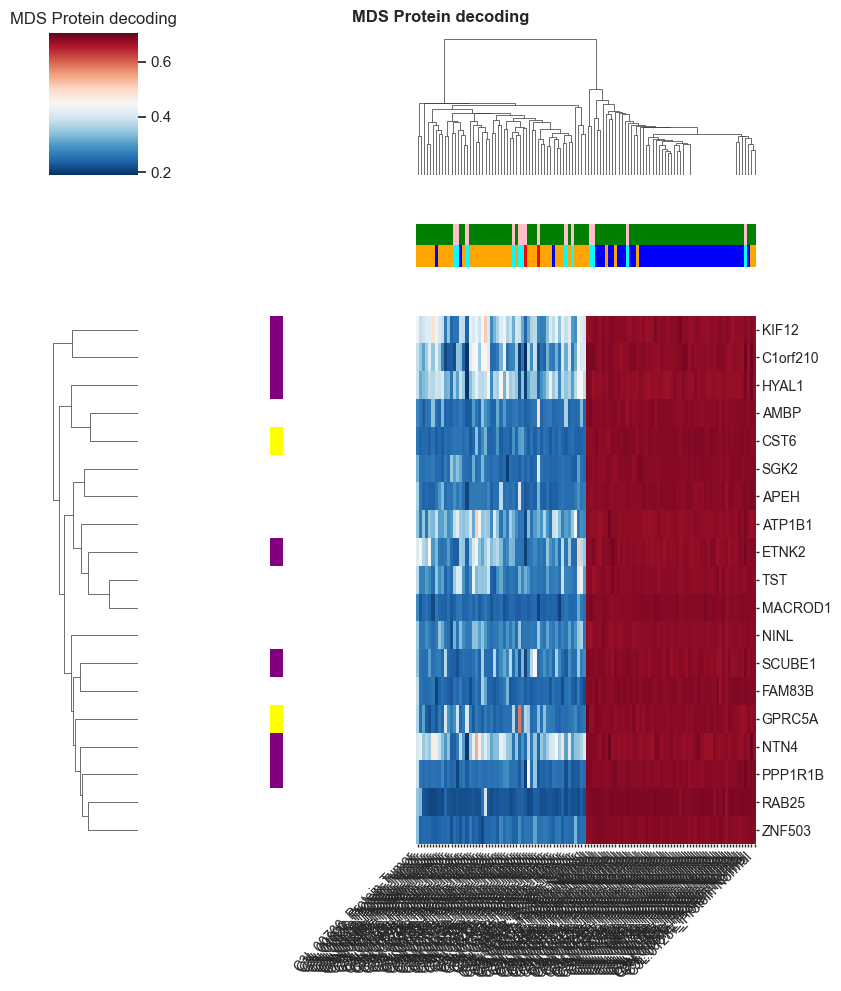

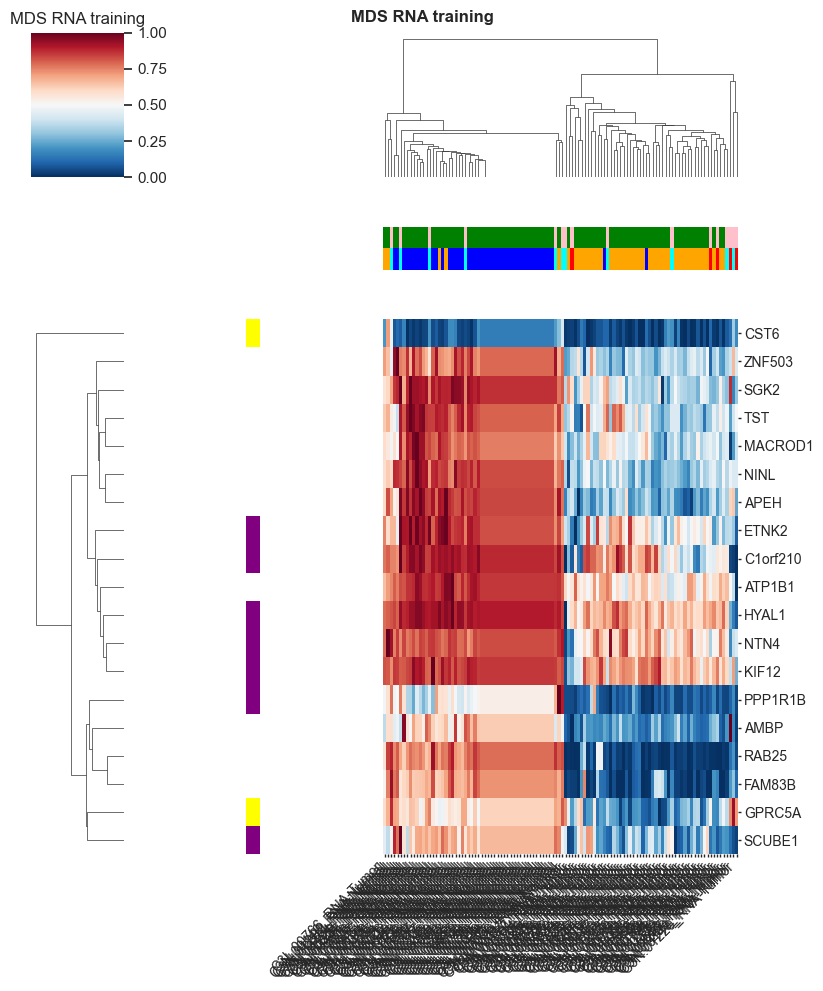

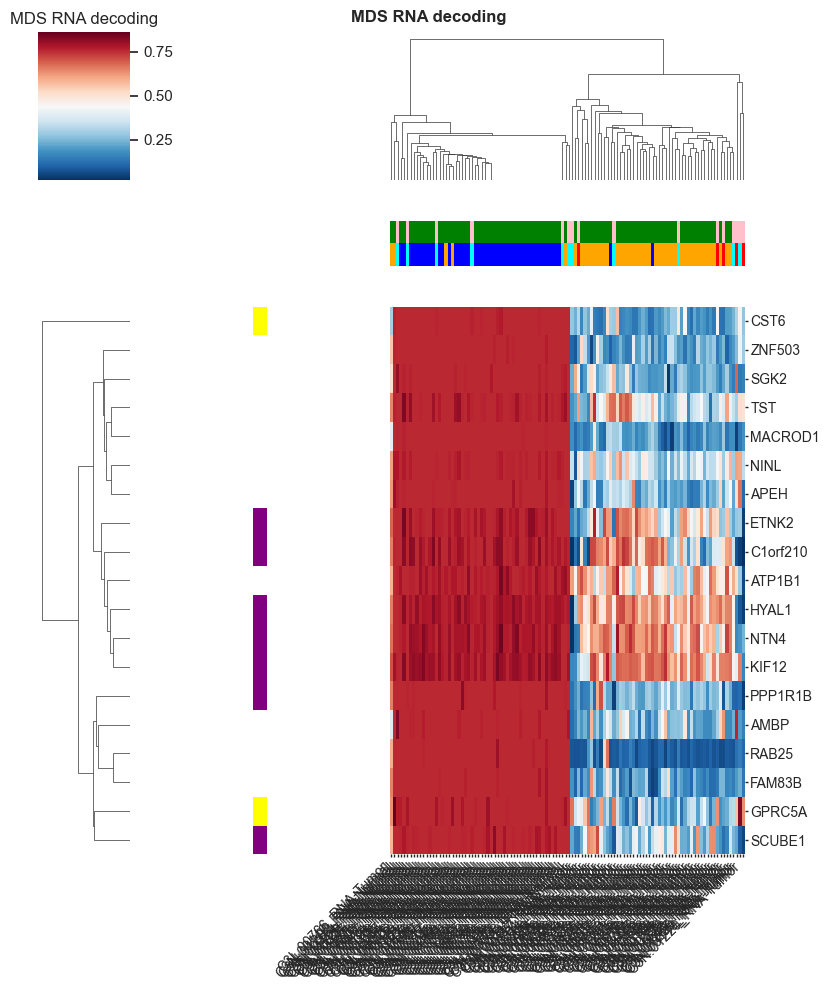

CpG


In [15]:
from sciviso import Heatmap
# get the genes that chanegd the mosy between
for f in feature_columns:
    try:
        s1_f_cols = [c for c in training_df.columns if f in c and 'Normal' in c and c.split('_')[0] in cond0_cases]
        s4_f_cols = [c for c in training_df.columns if f in c and 'Normal' in c and c.split('_')[0] in cond1_cases]

        s1_f_cols_t = [c for c in training_df.columns if f in c and 'Tumor' in c and c.split('_')[0] in cond0_cases]
        s4_f_cols_t = [c for c in training_df.columns if f in c and 'Tumor' in c and c.split('_')[0] in cond1_cases]

        column_colours_TN = ['blue'] * len(s1_f_cols) + ['orange'] * len(s1_f_cols_t) + ['cyan'] * len(s4_f_cols) + ['red'] * len(s4_f_cols_t)

        s1_f_cols = s1_f_cols + s1_f_cols_t
        s4_f_cols = s4_f_cols + s4_f_cols_t

        train_columns = s1_f_cols + s4_f_cols
        train_columns = [c for c in train_columns if c in plot_dec_df.columns]
        column_colours = ['green'] * len(s1_f_cols) + ['pink'] * len(s4_f_cols)
        # Combine the two dfs 
        # Pre compute the distance 
        vals = plot_df[train_columns]
        if len(vals) > 0:
            row_linkage, col_linkage = (hc.linkage(sp.distance.pdist(x), method='average')
                for x in (vals.values, vals.values.T))

            hm = Heatmap(plot_df, row_index='hgnc_symbol', 
                         chart_columns=train_columns, #cluster_cols=False, cluster_rows=False,
                         col_colours=[column_colours, column_colours_TN], row_colours=[row_colours],
                        config=vis_opts, title=f'{r} {f} training')
            hm.axis_line_width = 1.0
            hm.plot(row_linkage=row_linkage, col_linkage=col_linkage)
            plt.show()



            hm = Heatmap(plot_dec_df, row_index='hgnc_symbol', 
                         col_colours=[column_colours, column_colours_TN],  row_colours=[row_colours],
                         chart_columns=train_columns, #cluster_cols=False,cluster_rows=False,
                        config=vis_opts, title=f'{r} {f} decoding')
            hm.axis_line_width = 1.0
            hm.plot(row_linkage=row_linkage, col_linkage=col_linkage)
            plt.show()
    except:
        print(f)

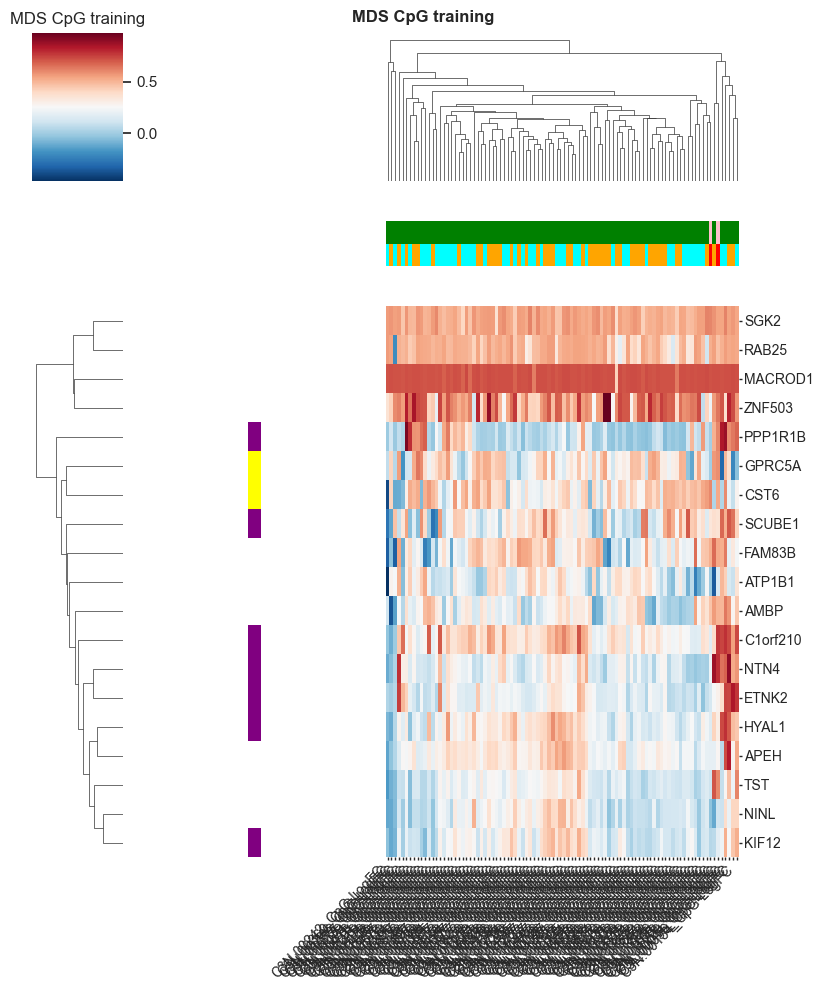

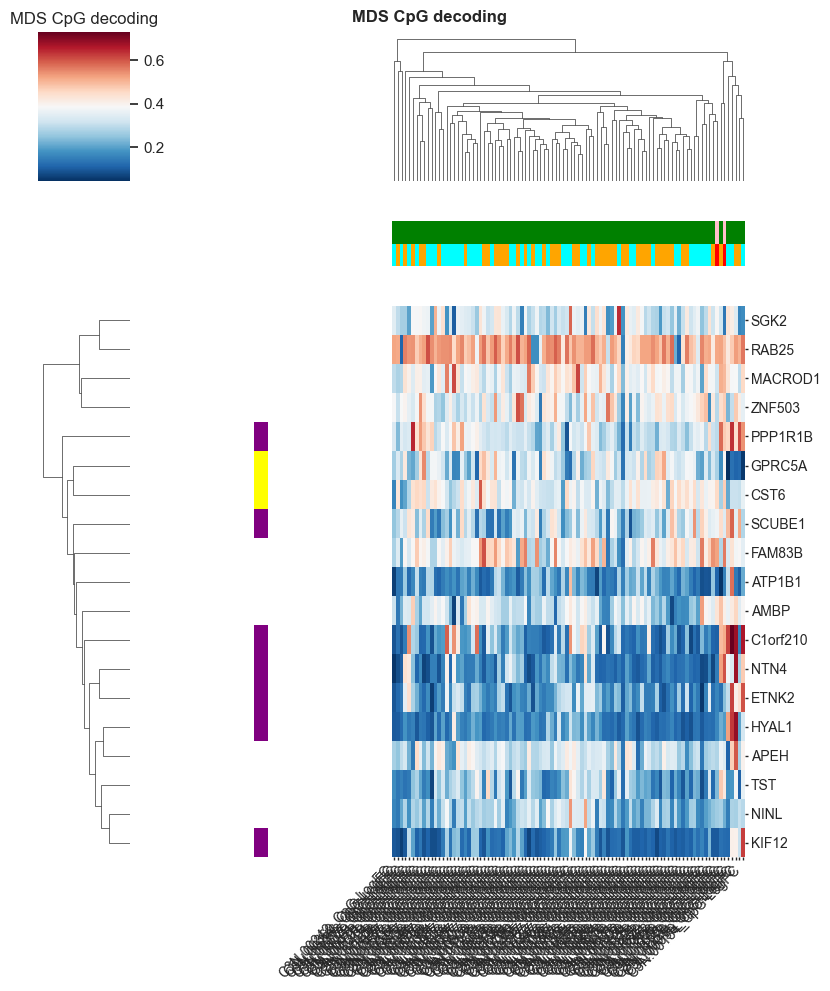

In [16]:

f = 'CpG'

train_columns = [c for c in training_df.columns if '_CpG-LogFC' in c] #s1_f_cols + s4_f_cols
train_columns = [c for c in train_columns if c in plot_dec_df.columns]
# Combine the two dfs 
# Pre compute the distance 
vals = plot_df[train_columns]
if len(vals) > 0:
    row_linkage, col_linkage = (hc.linkage(sp.distance.pdist(x), method='average')
        for x in (vals.values, vals.values.T))

    hm = Heatmap(plot_df, row_index='hgnc_symbol', 
                 chart_columns=train_columns, #cluster_cols=False, cluster_rows=False,
                 col_colours=[column_colours, column_colours_TN], row_colours=[row_colours],
                config=vis_opts, title=f'{r} {f} training')
    hm.axis_line_width = 1.0
    hm.plot(row_linkage=row_linkage, col_linkage=col_linkage)
    plt.show()



    hm = Heatmap(plot_dec_df, row_index='hgnc_symbol', 
                 col_colours=[column_colours, column_colours_TN],  row_colours=[row_colours],
                 chart_columns=train_columns, #cluster_cols=False,cluster_rows=False,
                config=vis_opts, title=f'{r} {f} decoding')
    hm.axis_line_width = 1.0
    hm.plot(row_linkage=row_linkage, col_linkage=col_linkage)
    plt.show()

# Plot some of the top genes in each group and colour by the 

## Do box plots of specific genes

In [16]:
ens_to_gene = dict(zip(vae_rcm_df.index.values, vae_rcm_df['external_gene_name'].values))
values = defaultdict(lambda: defaultdict(list))
for r in rcm_labels:
    encoding_df = sv.encoded_df[r]
    input_df = sv.raw_input_df[r] # Get the input DF
    # Make a df for each of the data types we want box plots for 
    for column in input_df.columns:
        if 'C' in column:
            c = column.split('_')
            values[c[1]]['values'] += [v for v in input_df[column].values]
            values[c[1]]['GeneId'] += [v for v in input_df.index.values]
            values[c[1]]['Cluster'] += [v for v in input_df['Regulation_Grouping_2'].values]
            case_info = patient_info[patient_info['SafeCases'] == c[0]]
            # Stage	BAP1&PBRM1 gender	TumorStage	AgeGrouped
            values[c[1]]['Gender'] += [case_info['gender'].values[0]] * len(input_df)
            values[c[1]]['Stage'] += [case_info['Stage'].values[0]] * len(input_df)
            values[c[1]]['Tumor Stage'] += [case_info['TumorStage'].values[0]] * len(input_df)
            values[c[1]]['Age'] += [case_info['AgeGrouped'].values[0]] * len(input_df)
            values[c[1]]['Mutation'] += [case_info['BAP1&PBRM1'].values[0]] * len(input_df)

    # Now we also want an encoding values 
    for column in encoding_df.columns:
        if 'C' in column:
            values['Integrated']['values'] += [c for c in encoding_df[column].values]
            values['Integrated']['GeneId'] += [c for c in encoding_df['id'].values]
            values['Integrated']['Cluster'] += [v for v in encoding_df['Regulation_Grouping_2'].values]
            case_info = patient_info[patient_info['SafeCases'] == column]

            values['Integrated']['Gender'] += [case_info['gender'].values[0]] * len(encoding_df)
            values['Integrated']['Stage'] += [case_info['Stage'].values[0]] * len(encoding_df)
            values['Integrated']['Tumor Stage'] += [case_info['TumorStage'].values[0]] * len(encoding_df)
            values['Integrated']['Age'] += [case_info['AgeGrouped'].values[0]] * len(encoding_df)
            values['Integrated']['Mutation'] += [case_info['BAP1&PBRM1'].values[0]] * len(encoding_df)

In [17]:
# Just formatting the data for a boxplot
dfs = {}
for v in values:
    print(v)
    box_df = pd.DataFrame()
    for c in values[v]:
        box_df[c] = values[v][c]
    dfs[v] = box_df
    
for d in dfs:
    dfs[d].to_csv(f'{stats_base_dir}Boxplot_data_{d}.csv', index=False)

Protein-Normal
Protein-Tumor
Protein-LogFC
RNA-Normal
RNA-Tumor
RNA-LogFC
CpG-Normal
CpG-Tumor
CpG-LogFC
Integrated


In [21]:
# Consolidate the data types for generic vis
rna_normal = dfs['RNA-Normal']
rna_normal['SampleType'] = 'Normal'
rna_tumour = dfs['RNA-Tumor']
rna_tumour['SampleType'] = 'Tumor'
rna = pd.concat([rna_tumour, rna_normal])

cpg_normal = dfs['CpG-Normal']
cpg_normal['SampleType'] = 'Normal'
cpg_tumour = dfs['CpG-Tumor']
cpg_tumour['SampleType'] = 'Tumor'
cpg = pd.concat([cpg_tumour, cpg_normal])

protein_normal = dfs['Protein-Normal']
protein_normal['SampleType'] = 'Normal'
protein_tumour = dfs['Protein-Tumor']
protein_tumour['SampleType'] = 'Tumor'
protein = pd.concat([protein_tumour, protein_normal])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Normal v.s. Tumor: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.750e-35 U_stat=1.059e+04


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Normal v.s. Tumor: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.606e-33 U_stat=9.409e+03


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Normal v.s. Tumor: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.190e-20 U_stat=1.500e+03
https://www.proteinatlas.org/ENSG00000119888-EPCAM/pathology/renal+cancer/KIRC


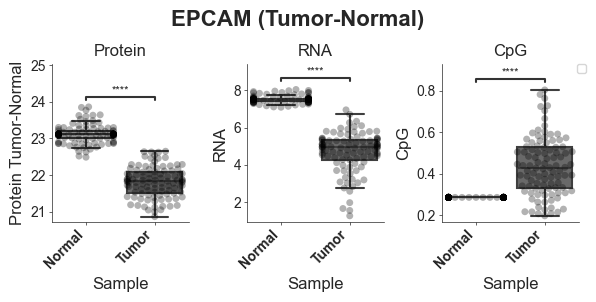

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Normal v.s. Tumor: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.038e-33 U_stat=1.046e+04


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Normal v.s. Tumor: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.858e-01 U_stat=4.648e+03


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Normal v.s. Tumor: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.640e-39 U_stat=1.000e+04
https://www.proteinatlas.org/ENSG00000004779-NDUFAB1/pathology/renal+cancer/KIRC


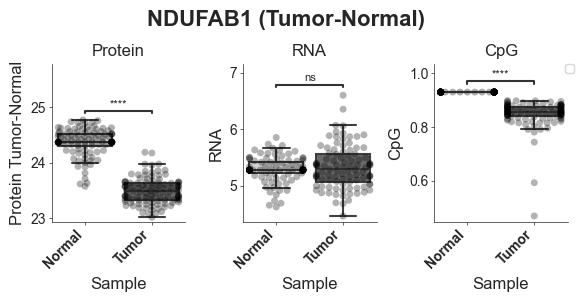

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Normal v.s. Tumor: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.745e-34 U_stat=1.200e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Normal v.s. Tumor: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.443e-32 U_stat=7.100e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Normal v.s. Tumor: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.703e-36 U_stat=9.800e+03
https://www.proteinatlas.org/ENSG00000103490-PYCARD/pathology/renal+cancer/KIRC


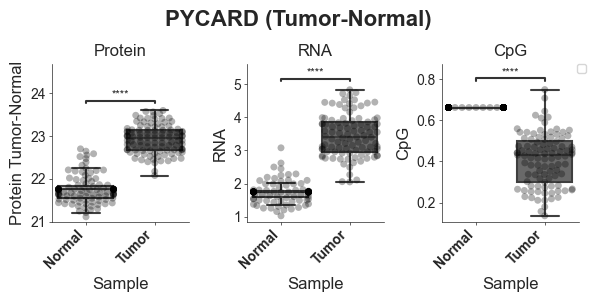

## Plotting function for a gene across the data types

In [ ]:
# Now we can iterate through each one and do whatever we need to do
plt.rcParams["figure.figsize"] = (12, 3)
plt.rcParams['svg.fonttype'] = 'none' 
import os
from sciviso import Boxplot

fig_size = (12, 3)
vis_opts = {"figsize": fig_size, "title_font_size": 12, "axis_font_size": 10, 
           'palette': ['lightgrey', 'dimgrey']}

def plot_gene_logfcs(gene, cond0, cond1, x="Stage", cmap="Purples"):
    fig, ax = plt.subplots(nrows=1, ncols=5)
    gene_name = ens_to_gene.get(gene)
    box_data_df = dfs['Integrated']
    #try:
    
    box_data_df = box_data_df[box_data_df[x].isin([cond0, cond1])]
    gene_data = box_data_df[box_data_df['GeneId'] == gene]
    b = Boxplot(gene_data, x=x, y="values",  add_dots=True, 
            add_stats=True, title=f'Integrated diff.',
            xlabel="Sample", ylabel=f'diff. {cond1}-{cond0}', config=vis_opts)
    b.plot(ax=ax[0], legend=False)
    #nt('Integrated')
    
    box_data_df = dfs['Protein-LogFC']
    try:
        box_data_df = box_data_df[box_data_df[x].isin([cond0, cond1])]
        gene_data = box_data_df[box_data_df['GeneId'] == gene]
        b = Boxplot(gene_data, x=x, y="values", add_dots=True, 
                add_stats=True, title=f'Protein logFC',
                xlabel="Sample", ylabel=f"Protein  {cond1}-{cond0}", config=vis_opts)
        b.plot(ax=ax[1])
    except:
        print('Protein logFC')
        
    box_data_df = dfs['Protein-Tumor']
    try:
        box_data_df = box_data_df[box_data_df[x].isin([cond0, cond1])]
        gene_data = box_data_df[box_data_df['GeneId'] == gene]
        b = Boxplot(gene_data, x=x, y="values", add_dots=True, 
                add_stats=True, title=f'Protein Tumor',
                xlabel="Sample", ylabel=f"Protein  {cond1}-{cond0}", config=vis_opts)
        b.plot(ax=ax[2])
    except:
        print('Protein')
        
    box_data_df = dfs['RNA-LogFC']
    try:
        box_data_df = box_data_df[box_data_df[x].isin([cond0, cond1])]
        gene_data = box_data_df[box_data_df['GeneId'] == gene]
        b = Boxplot(gene_data, x=x, y="values", add_dots=True, 
                add_stats=True, title=f'RNA logFC',
                xlabel="Sample", ylabel=f"RNA {cond1}-{cond0}", config=vis_opts)
        b.plot(ax=ax[3])
    except:
        print('RNA')
    box_data_df = dfs['CpG-LogFC']
    try:
        box_data_df = box_data_df[box_data_df[x].isin([cond0, cond1])]
        gene_data = box_data_df[box_data_df['GeneId'] == gene]
        
        b = Boxplot(gene_data, x=x, y="values", add_dots=True, 
                add_stats=True, title=f'CpG logFC',
                xlabel="Sample", ylabel=f"CpG {cond1}-{cond0}", config=vis_opts)
        b.plot(ax=ax[4])
    except:
        print('CpG')
    # ALso print the URL so that I can quickly check the ones that look good in protein atlas
    print(f'https://www.proteinatlas.org/{gene}-{gene_name}/pathology/renal+cancer/KIRC')
    fig.suptitle(f'{gene_name} ({cond1}-{cond0})', fontsize=16, fontweight='bold')
    fig.tight_layout()
    fig.subplots_adjust(top=0.8)
    if save_fig:
        plt.savefig(f'{fig_dir}boxplot_{gene_name}_{cond1}-{cond0}.svg')
    plt.show()

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.311e-04 U_stat=7.700e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.158e-01 U_stat=1.840e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.082e-02 U_stat=1.490e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.956e-04 U_stat=7.900e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.850e-02 U_stat=3.250e+02
https://www.proteinatlas.org/ENSG00000102755-FLT1/pathology/renal+cancer/KIRC


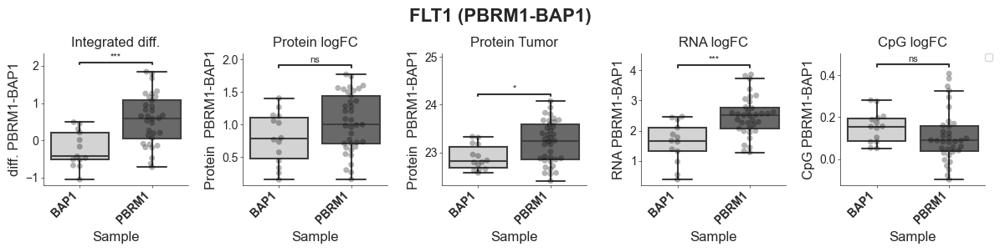

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.088e-01 U_stat=2.870e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.844e-01 U_stat=3.210e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.432e-01 U_stat=2.820e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.998e-01 U_stat=2.760e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.590e-01 U_stat=1.650e+02
https://www.proteinatlas.org/ENSG00000102755-FLT1/pathology/renal+cancer/KIRC


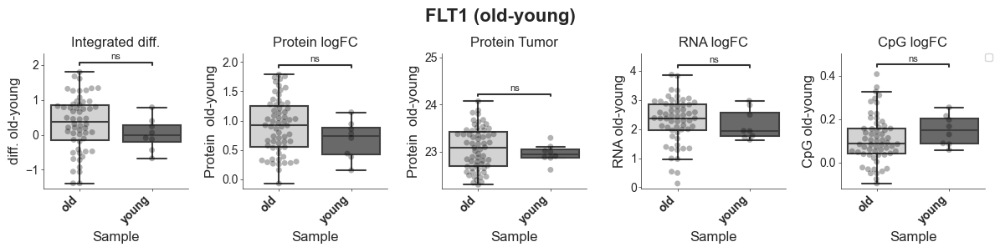

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.132e-02 U_stat=3.310e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.715e-01 U_stat=3.480e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.453e-02 U_stat=3.850e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.769e-02 U_stat=3.700e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.426e-01 U_stat=1.800e+02
https://www.proteinatlas.org/ENSG00000102755-FLT1/pathology/renal+cancer/KIRC


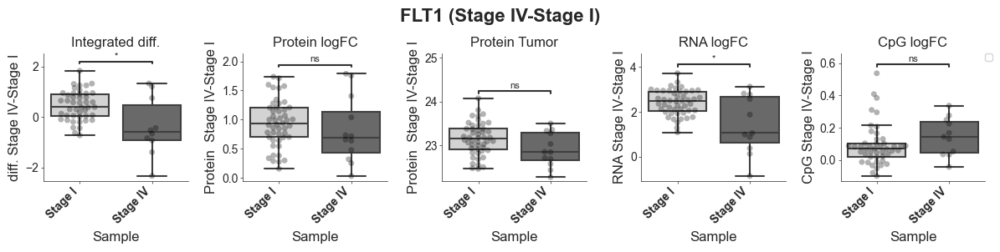

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.176e-03 U_stat=8.100e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.987e-03 U_stat=1.120e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.049e-04 U_stat=9.800e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.222e-02 U_stat=1.190e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.064e-02 U_stat=3.380e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000116016-EPAS1/pathology/renal+cancer/KIRC


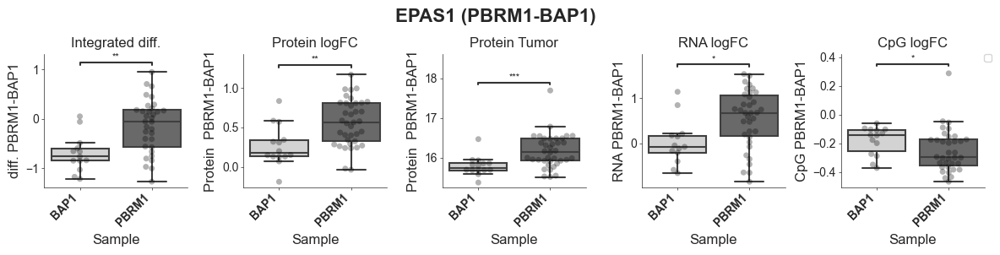

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.921e-01 U_stat=2.230e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.391e-01 U_stat=3.010e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.296e-01 U_stat=3.310e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.246e-01 U_stat=2.200e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.446e-01 U_stat=2.290e+02
https://www.proteinatlas.org/ENSG00000116016-EPAS1/pathology/renal+cancer/KIRC


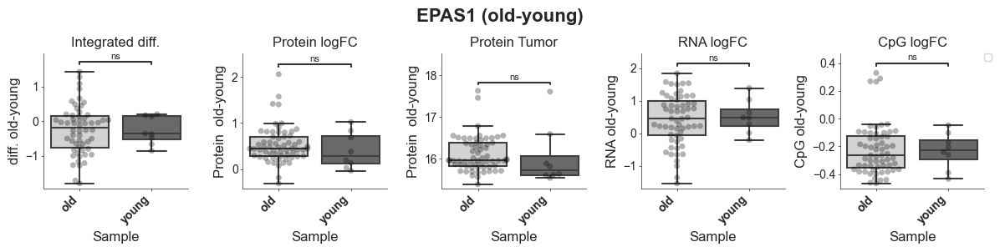

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.391e-02 U_stat=3.290e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.604e-01 U_stat=3.050e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.228e-01 U_stat=2.340e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.913e-02 U_stat=3.690e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.053e-03 U_stat=1.060e+02
https://www.proteinatlas.org/ENSG00000116016-EPAS1/pathology/renal+cancer/KIRC


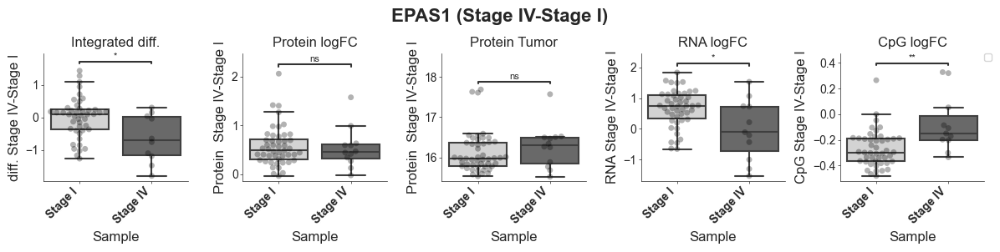

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.470e-02 U_stat=1.140e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.450e-02 U_stat=3.440e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.511e-03 U_stat=3.910e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.955e-04 U_stat=3.840e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.278e-02 U_stat=1.320e+02
https://www.proteinatlas.org/ENSG00000168961-LGALS9/pathology/renal+cancer/KIRC


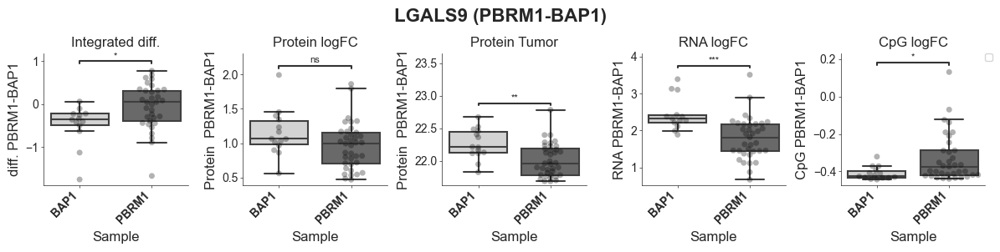

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.709e-03 U_stat=3.590e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.608e-01 U_stat=1.710e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.971e-01 U_stat=1.770e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.232e-03 U_stat=9.400e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.182e-01 U_stat=2.460e+02
https://www.proteinatlas.org/ENSG00000168961-LGALS9/pathology/renal+cancer/KIRC


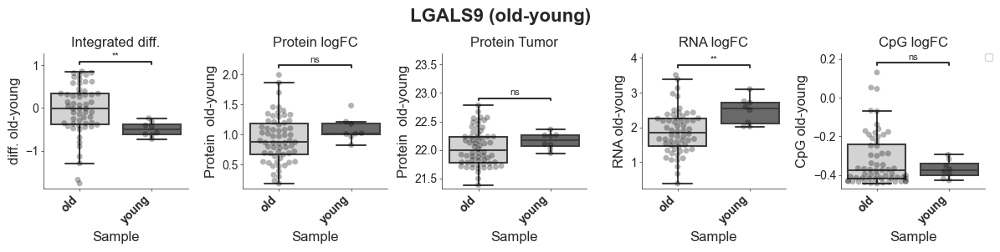

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.700e-01 U_stat=2.330e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.796e-01 U_stat=3.470e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.084e-02 U_stat=1.960e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.583e-01 U_stat=2.680e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.036e-01 U_stat=3.340e+02
https://www.proteinatlas.org/ENSG00000168961-LGALS9/pathology/renal+cancer/KIRC


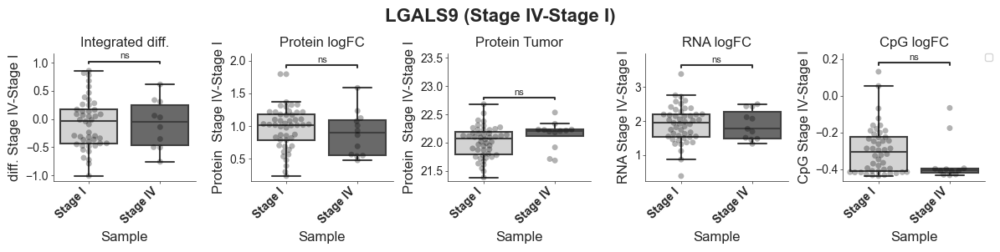

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.649e-03 U_stat=8.500e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.119e-01 U_stat=2.410e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.761e-02 U_stat=1.600e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.649e-03 U_stat=1.050e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.852e-02 U_stat=1.510e+02
https://www.proteinatlas.org/ENSG00000100644-HIF1A/pathology/renal+cancer/KIRC


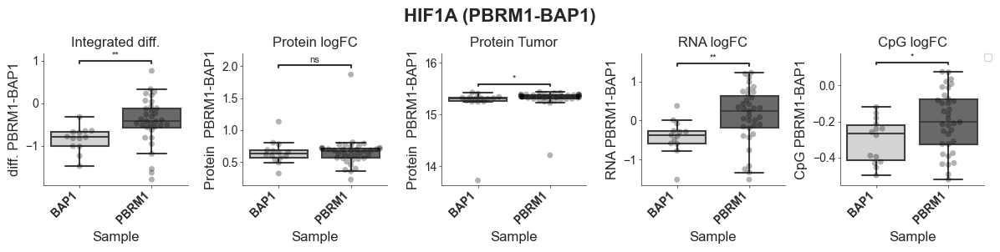

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.314e-01 U_stat=1.750e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.497e-02 U_stat=1.440e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.748e-02 U_stat=1.450e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.180e-01 U_stat=1.800e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.431e-01 U_stat=2.730e+02
https://www.proteinatlas.org/ENSG00000100644-HIF1A/pathology/renal+cancer/KIRC


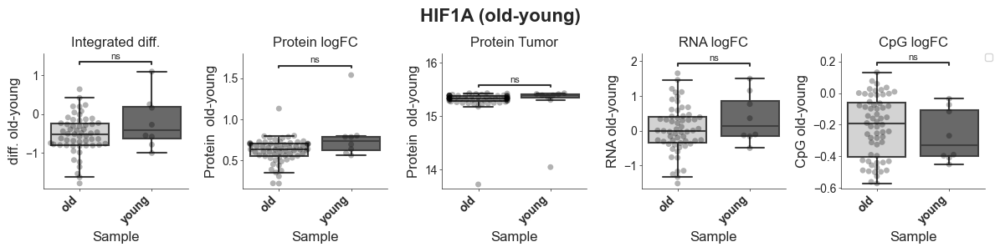

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.046e-03 U_stat=3.540e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.602e-05 U_stat=5.090e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.301e-02 U_stat=3.980e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.406e-03 U_stat=4.200e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.751e-02 U_stat=3.380e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000100644-HIF1A/pathology/renal+cancer/KIRC


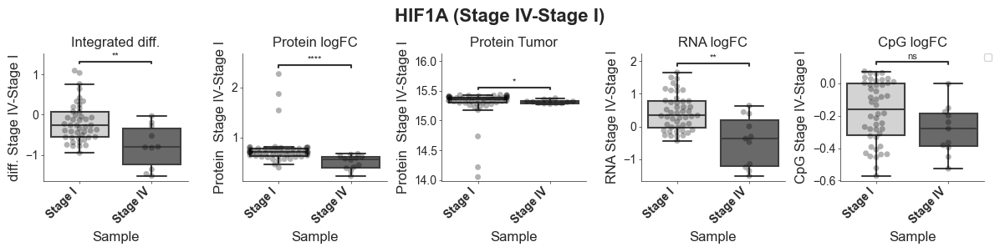

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.747e-01 U_stat=2.380e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.367e-01 U_stat=3.300e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.478e-02 U_stat=3.750e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.261e-01 U_stat=2.320e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.666e-01 U_stat=3.080e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000138079-SLC3A1/pathology/renal+cancer/KIRC


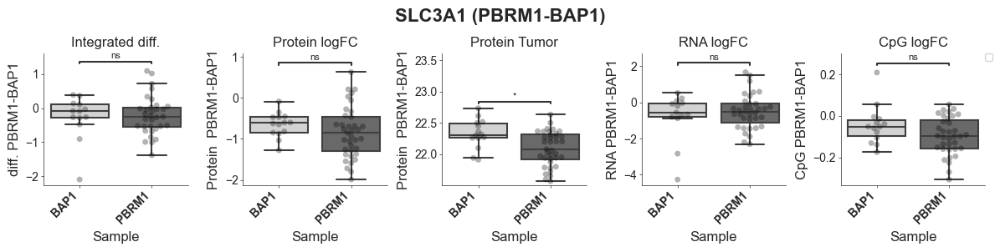

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.483e-01 U_stat=2.820e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.036e-01 U_stat=3.180e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.650e-01 U_stat=2.650e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.566e-01 U_stat=2.710e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.711e-01 U_stat=1.810e+02
https://www.proteinatlas.org/ENSG00000138079-SLC3A1/pathology/renal+cancer/KIRC


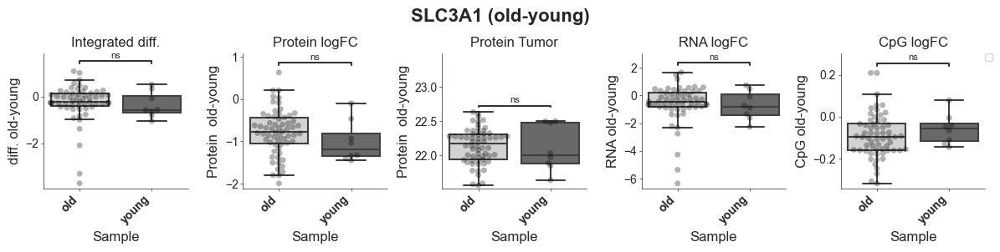

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.590e-02 U_stat=3.360e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.333e-01 U_stat=2.230e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.775e-01 U_stat=3.110e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.732e-02 U_stat=3.590e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.347e-02 U_stat=1.570e+02
https://www.proteinatlas.org/ENSG00000138079-SLC3A1/pathology/renal+cancer/KIRC


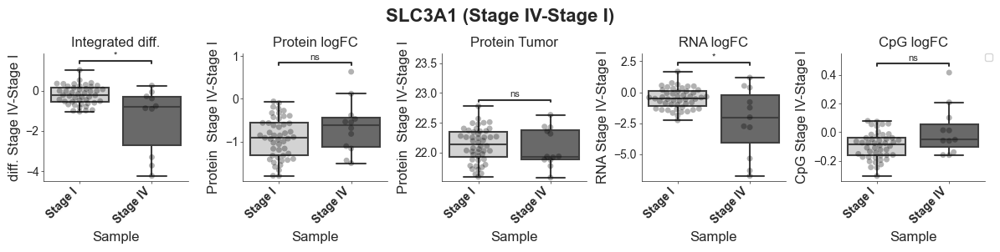

In [20]:
gene_to_ens = dict(zip(vae_rcm_df['external_gene_name'].values, vae_rcm_df.index.values))
ens_to_gene = dict(zip(vae_rcm_df.index.values, vae_rcm_df.external_gene_name.values))
for gene_name in ['FLT1', 'EPAS1', 'LGALS9', 'HIF1A', 'SLC3A1']:
    plot_gene_logfcs(gene_to_ens[gene_name], 'BAP1', 'PBRM1',  x='Mutation')
    # Do the same for old and young
    plot_gene_logfcs(gene_to_ens[gene_name], 'young', 'old',  x='Age')
    # And stage
    plot_gene_logfcs(gene_to_ens[gene_name], 'Stage I', 'Stage IV',  x='Tumor Stage')

--------------------------------------------------------------------------------
                                      MDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.049e-04 U_stat=3.740e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.987e-03 U_stat=1.120e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.189e-05 U_stat=5.100e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.180e-05 U_stat=4.400e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.898e-05 U_stat=4.270e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000185100-ADSS1/pathology/renal+cancer/KIRC


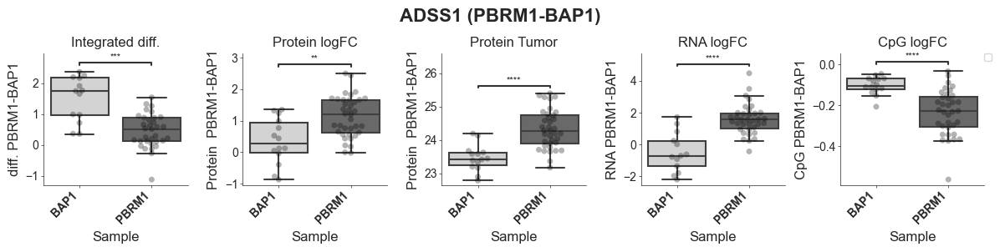

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.742e-05 U_stat=3.840e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.500e-01 U_stat=2.040e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.909e-01 U_stat=2.660e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.372e-06 U_stat=3.600e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.157e-03 U_stat=3.750e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000132639-SNAP25/pathology/renal+cancer/KIRC


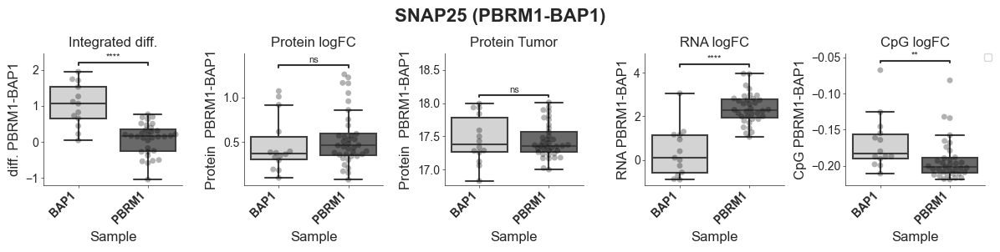

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.176e-03 U_stat=3.480e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.502e-04 U_stat=8.500e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.948e-04 U_stat=8.700e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.323e-03 U_stat=1.040e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.381e-01 U_stat=2.490e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000091127-PUS7/pathology/renal+cancer/KIRC


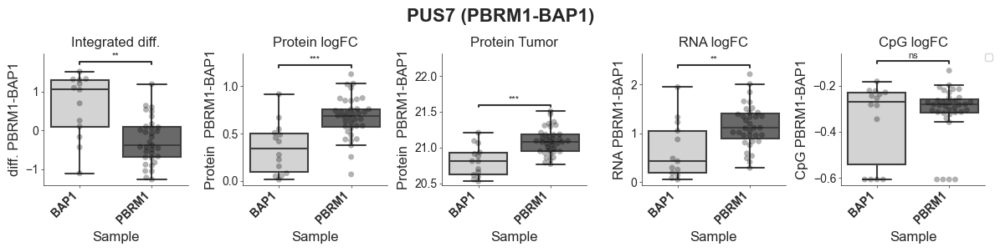

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.438e-05 U_stat=3.880e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.304e-04 U_stat=8.400e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.272e-06 U_stat=2.900e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.292e-04 U_stat=6.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.128e-02 U_stat=3.600e+02
https://www.proteinatlas.org/ENSG00000109107-ALDOC/pathology/renal+cancer/KIRC


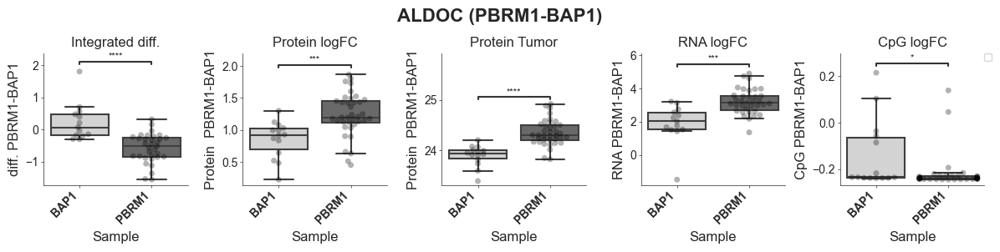

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.822e-04 U_stat=3.560e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.721e-03 U_stat=1.360e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.039e-04 U_stat=9.600e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.604e-03 U_stat=9.100e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.330e-02 U_stat=3.480e+02
https://www.proteinatlas.org/ENSG00000024422-EHD2/pathology/renal+cancer/KIRC


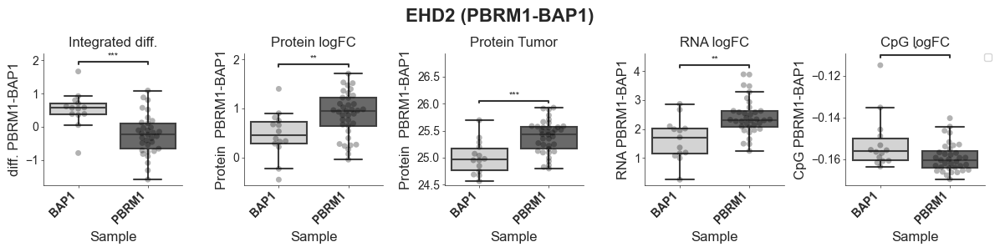

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.576e-05 U_stat=5.300e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.758e-04 U_stat=4.280e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.799e-05 U_stat=4.500e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.435e-05 U_stat=4.150e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.316e-01 U_stat=2.610e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000198758-EPS8L3/pathology/renal+cancer/KIRC


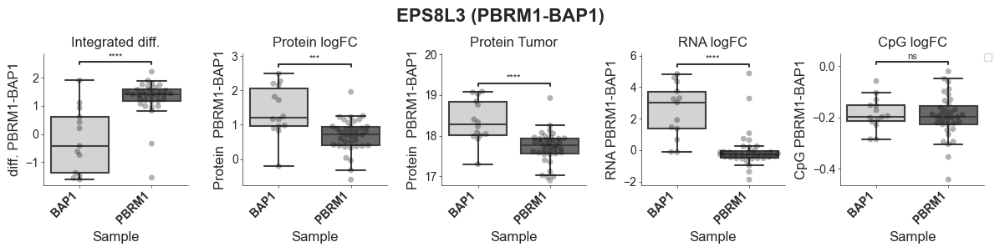

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.261e-05 U_stat=3.500e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.189e-05 U_stat=4.670e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.065e-05 U_stat=4.570e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.967e-05 U_stat=4.080e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.788e-02 U_stat=3.280e+02
https://www.proteinatlas.org/ENSG00000277586-NEFL/pathology/renal+cancer/KIRC


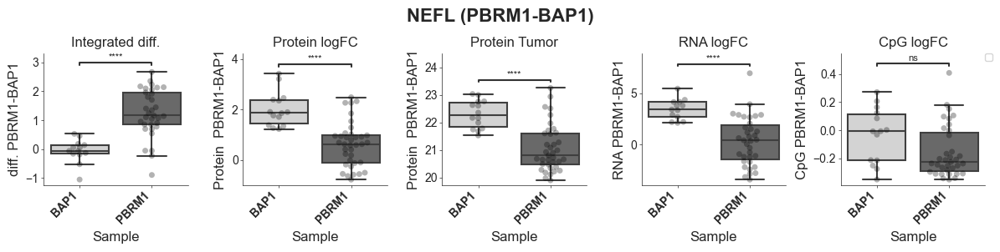

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.994e-05 U_stat=5.100e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.208e-01 U_stat=3.330e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.927e-01 U_stat=2.920e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.113e-06 U_stat=4.290e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.128e-02 U_stat=3.270e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000075340-ADD2/pathology/renal+cancer/KIRC


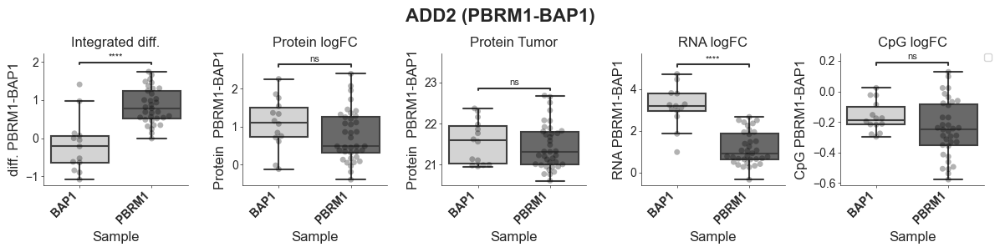

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.281e-03 U_stat=8.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.960e-02 U_stat=3.570e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.217e-02 U_stat=3.610e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.465e-04 U_stat=3.770e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.031e-01 U_stat=2.390e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000242515-UGT1A10/pathology/renal+cancer/KIRC


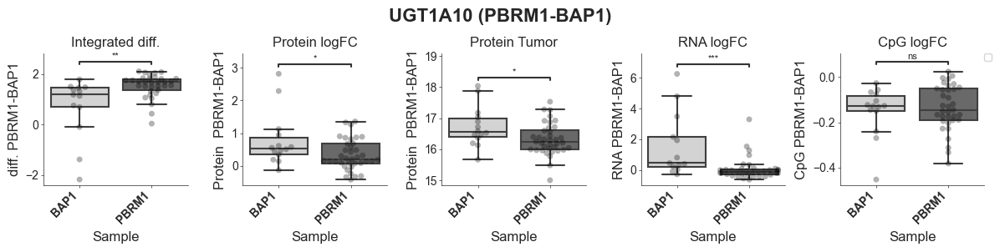

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.356e-04 U_stat=6.700e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.502e-04 U_stat=4.330e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.573e-05 U_stat=4.470e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.031e-03 U_stat=3.610e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.733e-01 U_stat=2.950e+02
https://www.proteinatlas.org/ENSG00000105976-MET/pathology/renal+cancer/KIRC


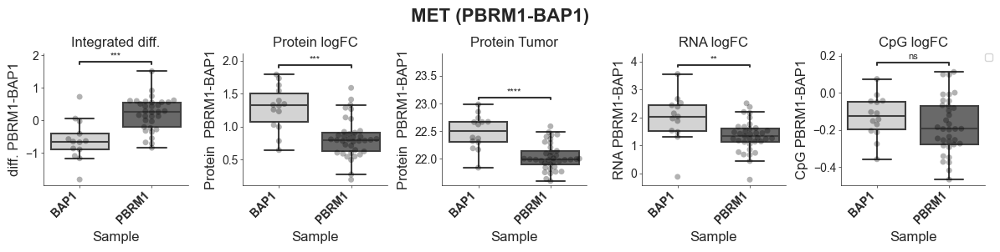

--------------------------------------------------------------------------------
                                     TPDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.690e-06 U_stat=2.800e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.215e-04 U_stat=1.000e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.596e-06 U_stat=4.500e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.161e-05 U_stat=3.800e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.066e-01 U_stat=2.830e+02
https://www.proteinatlas.org/ENSG00000147231-RADX/pathology/renal+cancer/KIRC


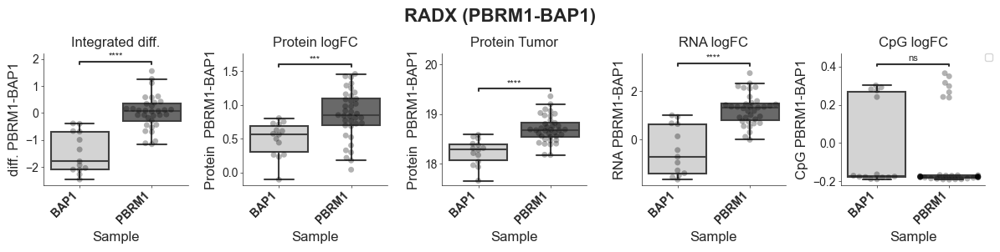

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.758e-05 U_stat=3.800e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.300e-05 U_stat=6.700e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.270e-05 U_stat=7.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.043e-05 U_stat=3.700e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.483e-01 U_stat=2.600e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000147202-DIAPH2/pathology/renal+cancer/KIRC


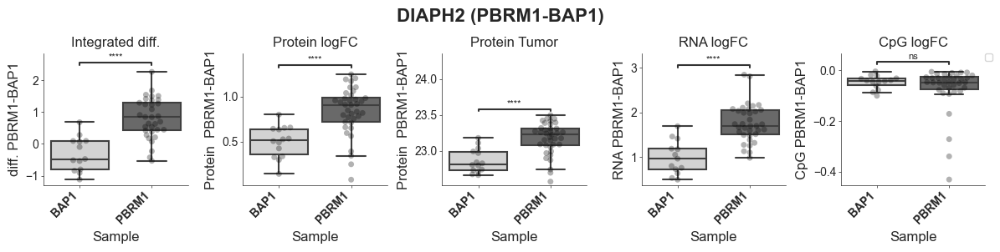

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.656e-03 U_stat=9.800e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.367e-01 U_stat=1.880e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.968e-02 U_stat=1.480e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.597e-04 U_stat=7.600e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.909e-04 U_stat=4.030e+02
https://www.proteinatlas.org/ENSG00000079689-SCGN/pathology/renal+cancer/KIRC


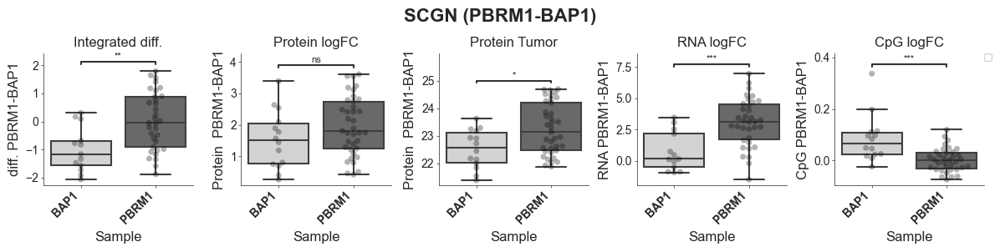

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.918e-03 U_stat=9.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.836e-03 U_stat=1.250e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.022e-03 U_stat=1.180e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.583e-02 U_stat=1.230e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.733e-01 U_stat=2.950e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000087250-MT3/pathology/renal+cancer/KIRC


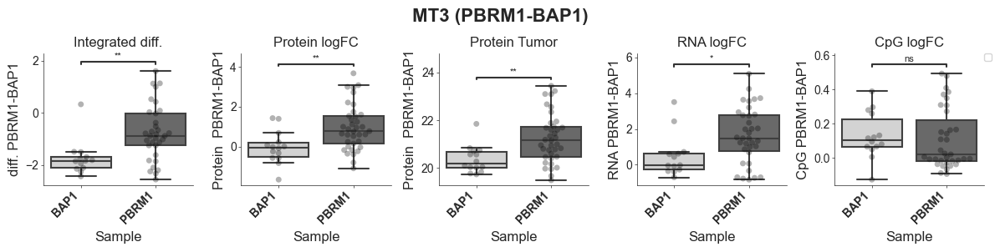

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.792e-03 U_stat=8.600e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.734e-01 U_stat=1.940e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.652e-01 U_stat=2.380e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.710e-04 U_stat=6.500e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000119630-PGF/pathology/renal+cancer/KIRC


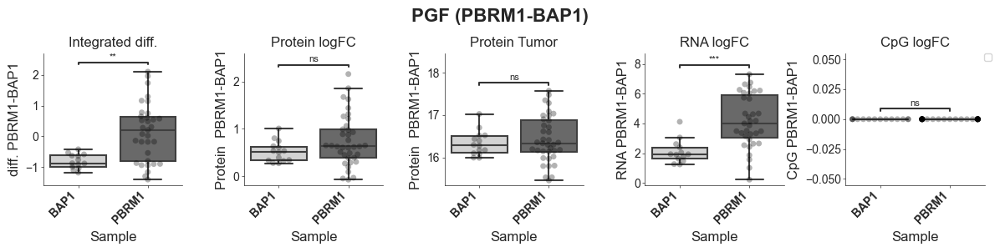

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.691e-05 U_stat=3.800e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.685e-05 U_stat=4.550e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.919e-05 U_stat=4.620e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.701e-04 U_stat=3.850e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.446e-02 U_stat=3.560e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000177409-SAMD9L/pathology/renal+cancer/KIRC


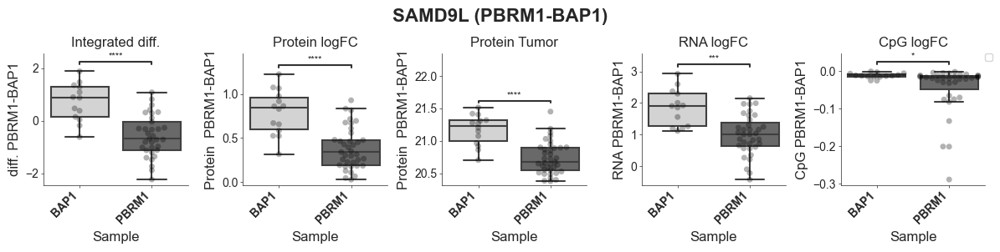

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.822e-04 U_stat=3.560e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.511e-03 U_stat=3.910e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.612e-04 U_stat=4.190e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.558e-04 U_stat=3.910e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000012779-ALOX5/pathology/renal+cancer/KIRC


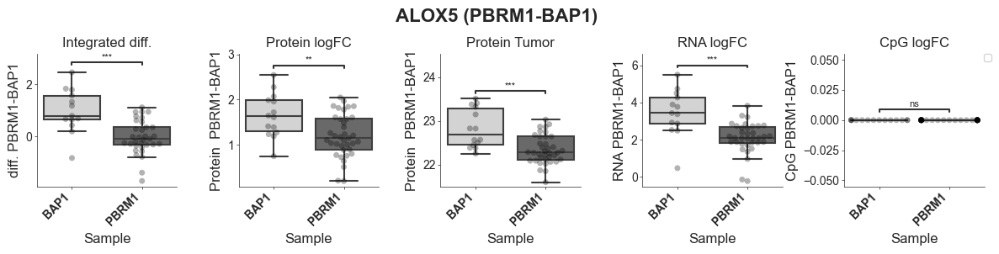

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.024e-03 U_stat=3.300e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.033e-02 U_stat=3.810e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.289e-03 U_stat=4.040e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.323e-03 U_stat=3.510e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000204632-HLA-G/pathology/renal+cancer/KIRC


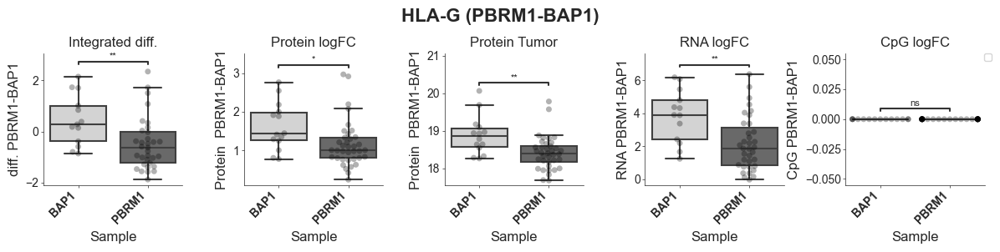

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.486e-03 U_stat=3.390e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.142e-03 U_stat=3.830e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.314e-02 U_stat=3.770e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.481e-03 U_stat=3.650e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000157601-MX1/pathology/renal+cancer/KIRC


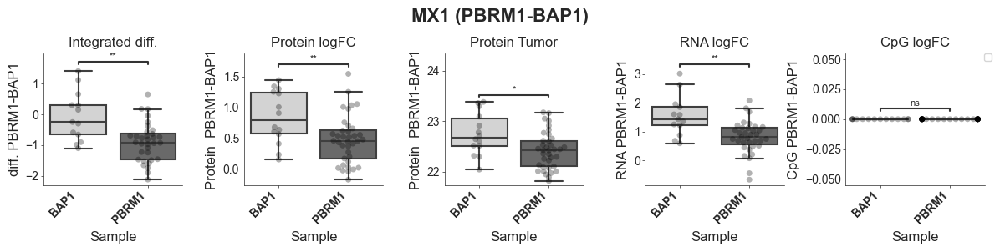

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.649e-03 U_stat=3.440e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.196e-03 U_stat=4.130e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.022e-03 U_stat=4.000e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.640e-03 U_stat=3.450e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000128335-APOL2/pathology/renal+cancer/KIRC


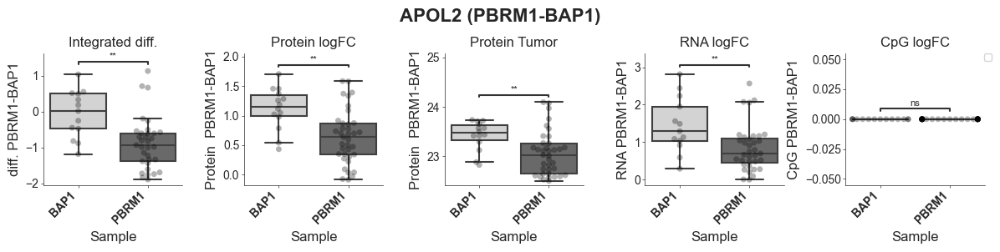

--------------------------------------------------------------------------------
                                     TPDS	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.162e-06 U_stat=3.000e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.455e-03 U_stat=1.150e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.065e-05 U_stat=6.100e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.595e-05 U_stat=4.100e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000165959-CLMN/pathology/renal+cancer/KIRC


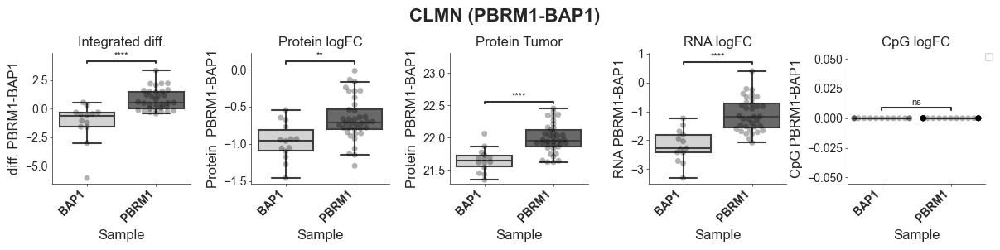

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.964e-04 U_stat=7.500e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.585e-01 U_stat=2.150e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.566e-02 U_stat=1.440e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.292e-04 U_stat=6.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.559e-01 U_stat=2.480e+02
https://www.proteinatlas.org/ENSG00000175600-SUGCT/pathology/renal+cancer/KIRC


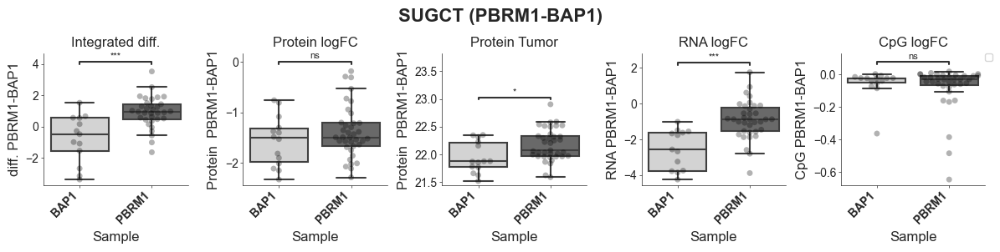

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.993e-03 U_stat=9.600e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.968e-02 U_stat=1.480e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.836e-03 U_stat=1.250e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.232e-04 U_stat=7.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.354e-01 U_stat=2.165e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000072042-RDH11/pathology/renal+cancer/KIRC


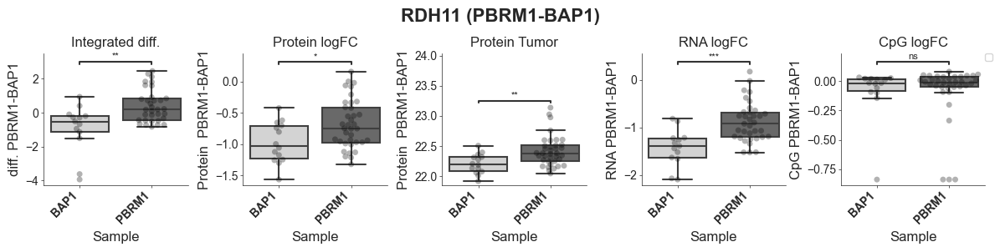

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.517e-03 U_stat=8.400e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.033e-02 U_stat=1.370e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.612e-04 U_stat=9.900e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.372e-03 U_stat=9.600e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.526e-01 U_stat=2.025e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000171723-GPHN/pathology/renal+cancer/KIRC


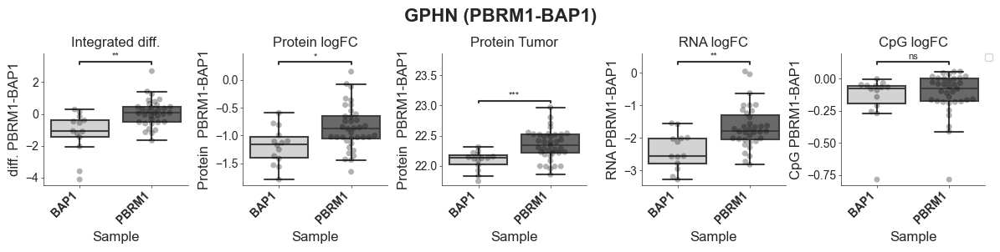

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.486e-03 U_stat=9.000e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.092e-01 U_stat=1.990e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.089e-02 U_stat=1.660e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.764e-03 U_stat=9.800e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.508e-01 U_stat=2.540e+02
https://www.proteinatlas.org/ENSG00000276644-DACH1/pathology/renal+cancer/KIRC


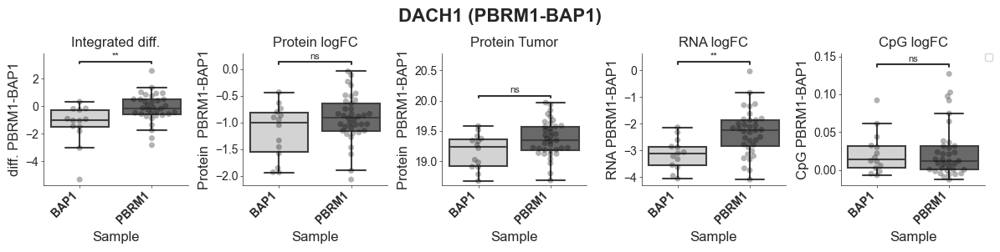

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.261e-05 U_stat=3.940e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.659e-02 U_stat=3.730e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.558e-04 U_stat=4.160e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.354e-04 U_stat=3.720e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.038e-01 U_stat=1.710e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000132855-ANGPTL3/pathology/renal+cancer/KIRC


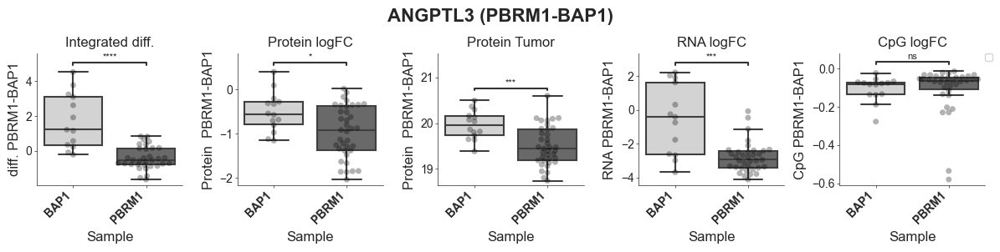

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.261e-05 U_stat=3.940e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.511e-03 U_stat=3.910e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.722e-03 U_stat=4.080e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.771e-05 U_stat=4.130e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000167608-TMC4/pathology/renal+cancer/KIRC


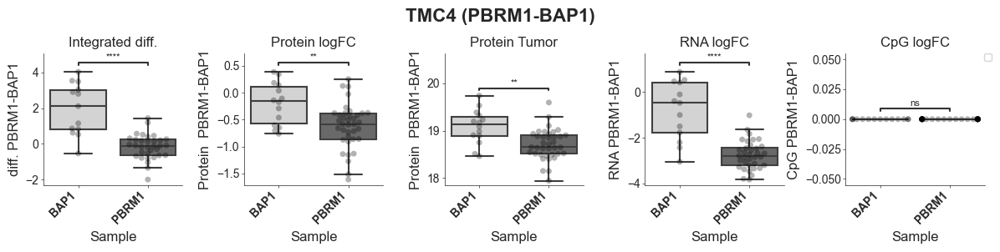

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.160e-04 U_stat=3.730e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.659e-02 U_stat=3.730e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.602e-03 U_stat=4.090e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.419e-04 U_stat=3.920e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.822e-01 U_stat=2.260e+02
https://www.proteinatlas.org/ENSG00000154277-UCHL1/pathology/renal+cancer/KIRC


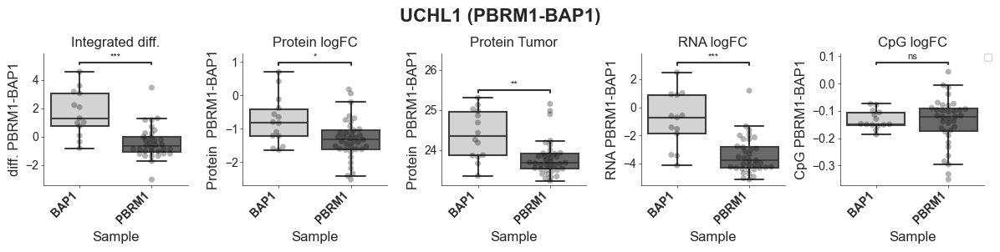

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.684e-04 U_stat=3.610e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.287e-03 U_stat=4.120e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.277e-04 U_stat=4.410e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.465e-03 U_stat=3.540e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000118514-ALDH8A1/pathology/renal+cancer/KIRC


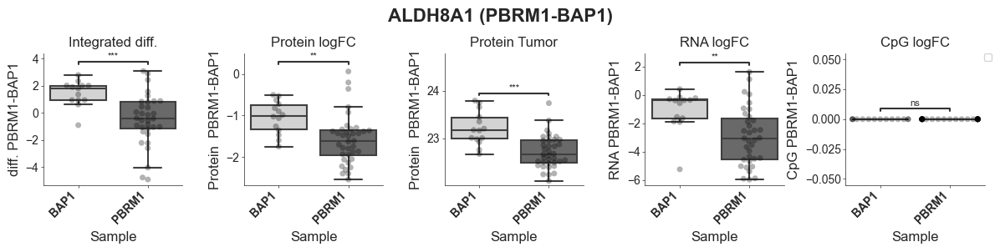

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.365e-05 U_stat=3.850e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.879e-03 U_stat=3.900e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.163e-03 U_stat=3.920e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.771e-05 U_stat=4.130e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000135447-PPP1R1A/pathology/renal+cancer/KIRC


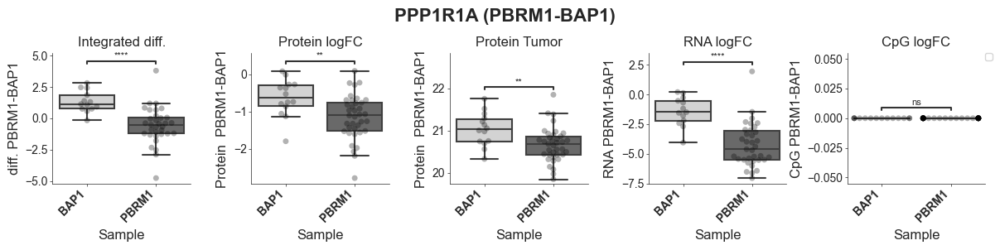

--------------------------------------------------------------------------------
                                     TMDS	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.055e-04 U_stat=6.600e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.061e-01 U_stat=2.270e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.167e-02 U_stat=1.620e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.826e-05 U_stat=5.800e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.136e-01 U_stat=1.730e+02
https://www.proteinatlas.org/ENSG00000072657-TRHDE/pathology/renal+cancer/KIRC


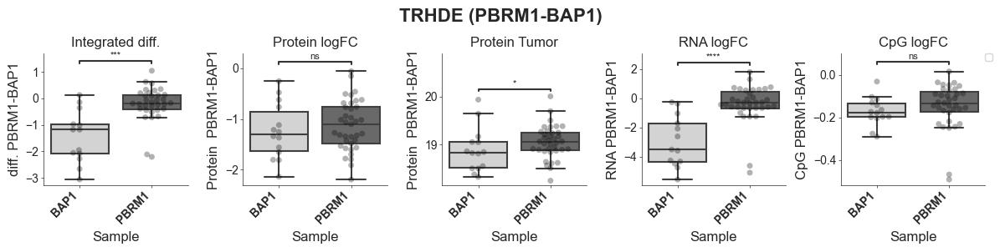

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.747e-05 U_stat=5.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.611e-02 U_stat=1.680e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.163e-03 U_stat=1.260e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.907e-05 U_stat=5.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.926e-02 U_stat=1.460e+02
https://www.proteinatlas.org/ENSG00000151338-MIPOL1/pathology/renal+cancer/KIRC


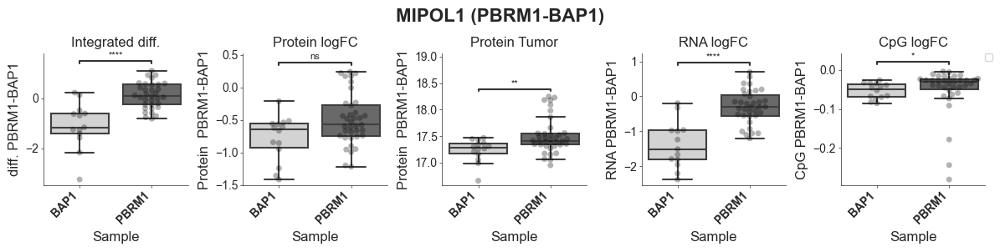

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.176e-03 U_stat=8.100e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.527e-03 U_stat=1.240e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.455e-03 U_stat=1.150e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.261e-03 U_stat=8.800e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.185e-01 U_stat=2.220e+02
https://www.proteinatlas.org/ENSG00000172260-NEGR1/pathology/renal+cancer/KIRC


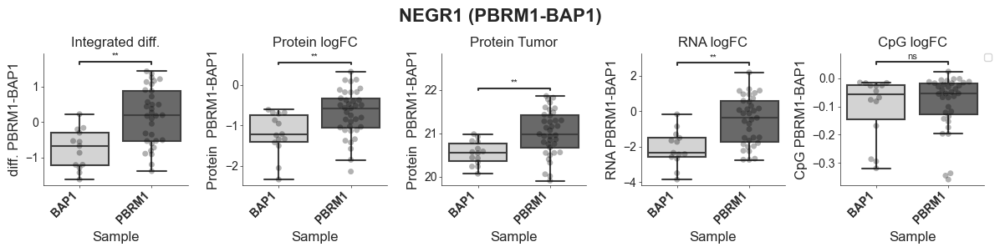

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.041e-04 U_stat=6.900e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.264e-01 U_stat=2.120e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.110e-01 U_stat=1.830e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.980e-05 U_stat=5.400e+01
p-value annotation legend:


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.846e-02 U_stat=3.310e+02
https://www.proteinatlas.org/ENSG00000172828-CES3/pathology/renal+cancer/KIRC


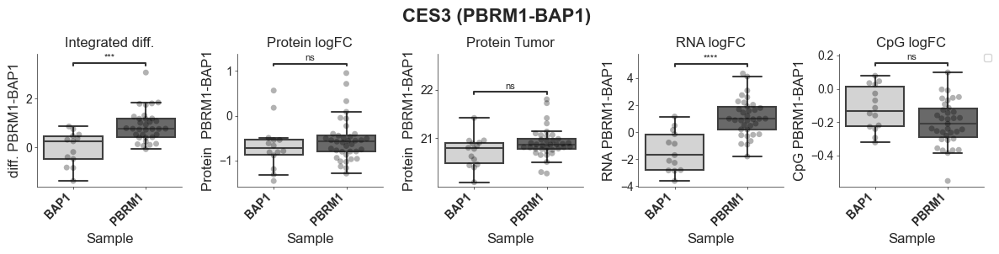

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.964e-04 U_stat=7.500e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.697e-01 U_stat=2.160e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.542e-01 U_stat=1.910e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.597e-04 U_stat=7.600e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.822e-01 U_stat=2.260e+02
https://www.proteinatlas.org/ENSG00000257335-MGAM/pathology/renal+cancer/KIRC


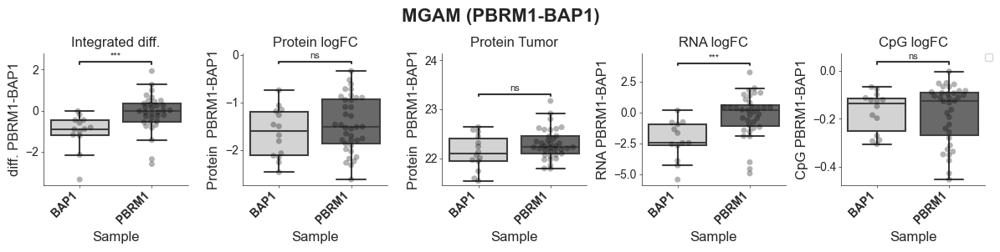

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.311e-07 U_stat=4.170e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.863e-04 U_stat=4.170e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.950e-04 U_stat=4.360e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.759e-07 U_stat=4.470e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.821e-01 U_stat=2.320e+02
https://www.proteinatlas.org/ENSG00000108179-PPIF/pathology/renal+cancer/KIRC


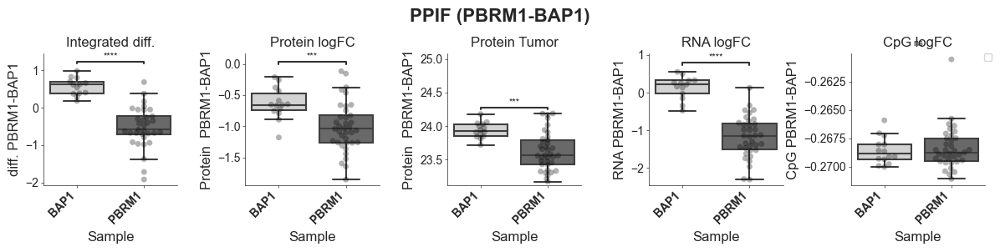

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.792e-03 U_stat=3.430e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.236e-03 U_stat=3.990e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.237e-03 U_stat=3.950e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.604e-03 U_stat=3.640e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.469e-01 U_stat=2.020e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000002726-AOC1/pathology/renal+cancer/KIRC


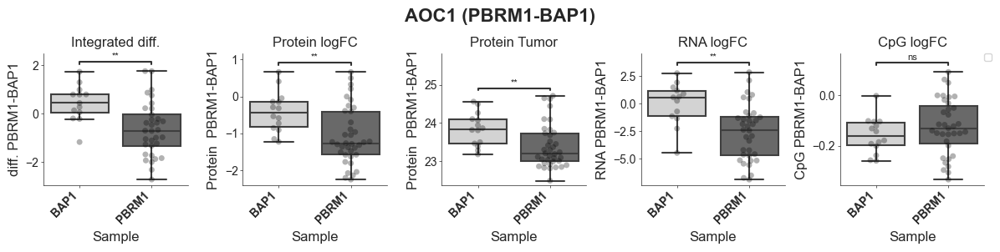

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.691e-05 U_stat=3.800e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.075e-03 U_stat=3.850e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.385e-03 U_stat=4.110e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.180e-05 U_stat=4.110e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.544e-01 U_stat=2.970e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000148344-PTGES/pathology/renal+cancer/KIRC


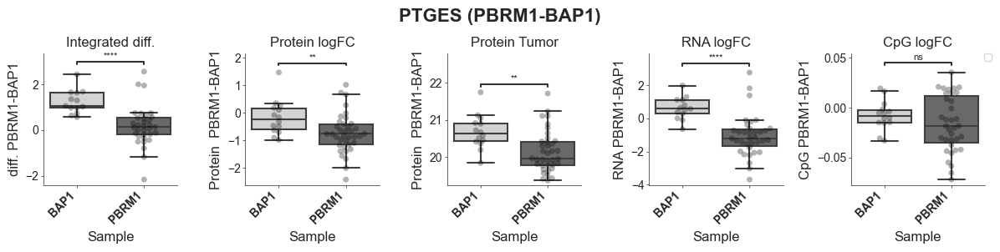

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.620e-05 U_stat=3.820e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.463e-03 U_stat=3.980e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.072e-04 U_stat=4.270e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.868e-06 U_stat=4.250e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000149418-ST14/pathology/renal+cancer/KIRC


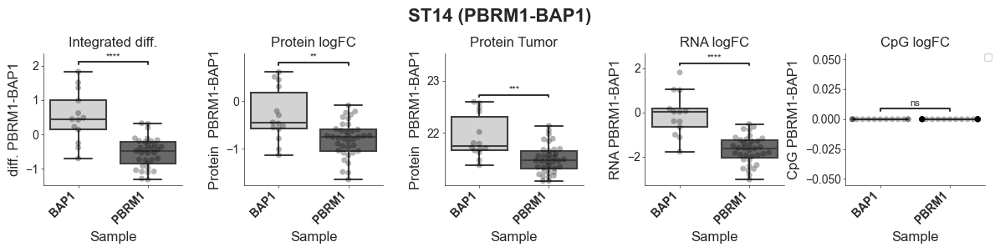

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.720e-04 U_stat=3.690e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.314e-02 U_stat=3.770e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.463e-03 U_stat=3.980e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.679e-05 U_stat=4.090e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.637e-01 U_stat=2.960e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000127838-PNKD/pathology/renal+cancer/KIRC


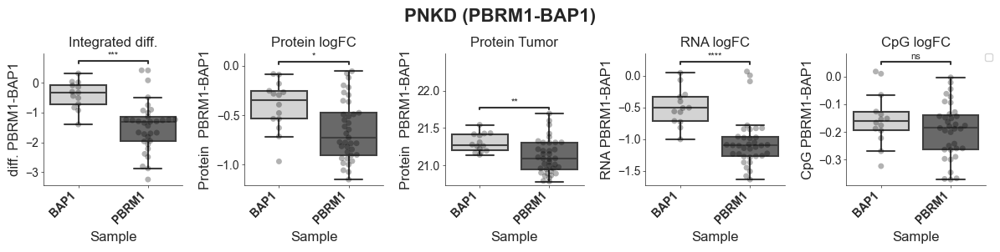

--------------------------------------------------------------------------------
                                     TMDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.716e-05 U_stat=4.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.745e-05 U_stat=5.500e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.685e-05 U_stat=6.300e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.558e-04 U_stat=6.400e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000101871-MID1/pathology/renal+cancer/KIRC


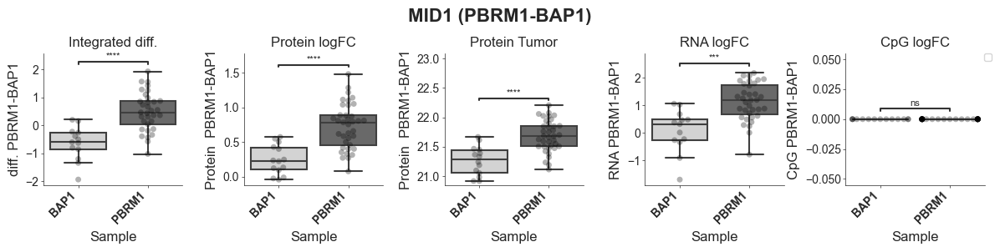

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.742e-05 U_stat=4.500e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.164e-04 U_stat=9.400e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.931e-05 U_stat=7.000e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.392e-02 U_stat=1.210e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.599e-01 U_stat=1.810e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000119640-ACYP1/pathology/renal+cancer/KIRC


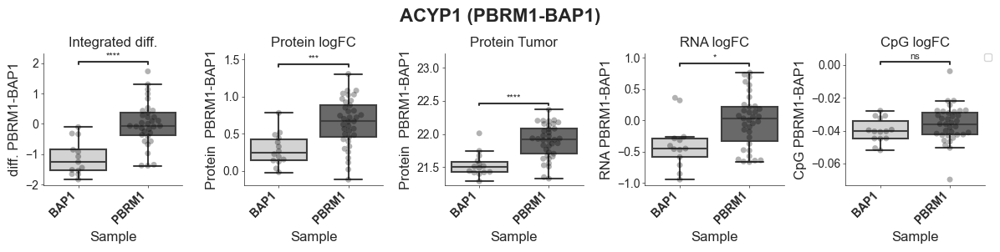

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.610e-04 U_stat=7.600e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.754e-02 U_stat=1.800e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.314e-02 U_stat=1.410e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.014e-04 U_stat=7.700e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.342e-01 U_stat=2.230e+02
https://www.proteinatlas.org/ENSG00000154217-PITPNC1/pathology/renal+cancer/KIRC


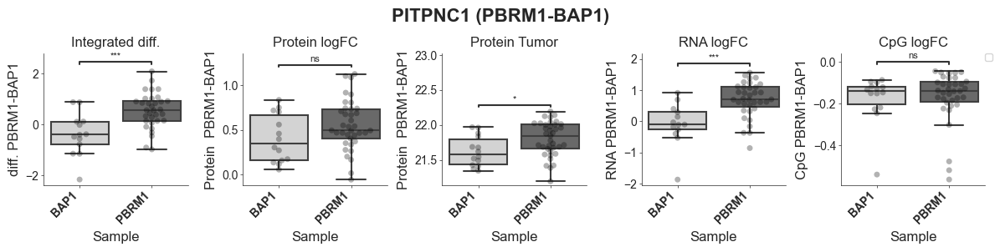

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.486e-03 U_stat=9.000e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.383e-02 U_stat=1.630e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.110e-03 U_stat=1.040e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.232e-04 U_stat=7.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.478e-03 U_stat=3.710e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000151364-KCTD14/pathology/renal+cancer/KIRC


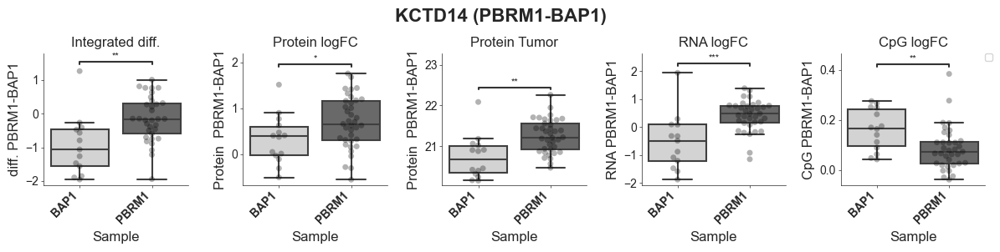

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.281e-03 U_stat=8.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.721e-03 U_stat=1.360e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.799e-05 U_stat=6.800e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.649e-03 U_stat=1.050e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.138e-01 U_stat=2.150e+02
https://www.proteinatlas.org/ENSG00000182621-PLCB1/pathology/renal+cancer/KIRC


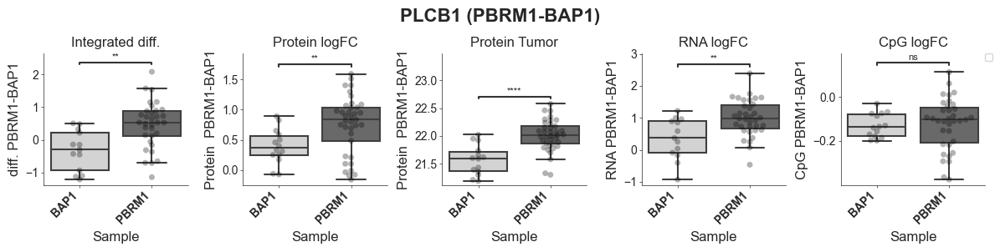

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.318e-04 U_stat=3.570e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.196e-03 U_stat=4.130e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.863e-04 U_stat=4.170e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.354e-04 U_stat=3.720e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.857e-01 U_stat=2.130e+02
https://www.proteinatlas.org/ENSG00000160678-S100A1/pathology/renal+cancer/KIRC


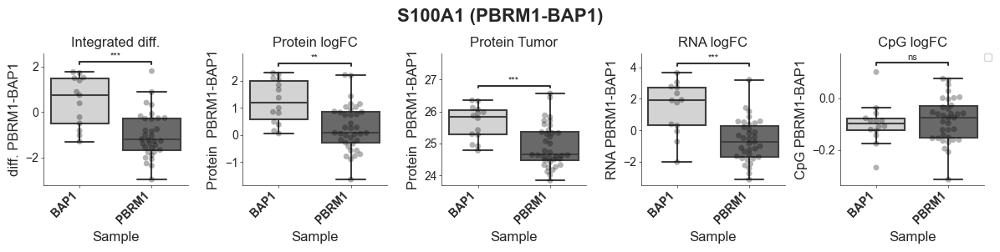

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.497e-06 U_stat=4.080e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.572e-02 U_stat=3.590e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.611e-02 U_stat=3.500e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.215e-06 U_stat=4.320e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.508e-01 U_stat=2.360e+02
https://www.proteinatlas.org/ENSG00000114923-SLC4A3/pathology/renal+cancer/KIRC


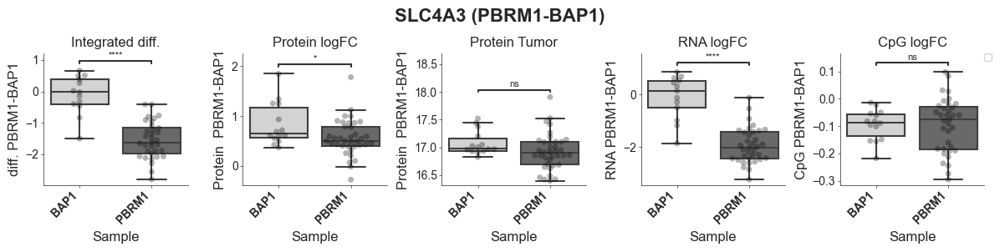

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.215e-06 U_stat=4.090e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.423e-05 U_stat=4.530e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.441e-05 U_stat=4.650e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.113e-06 U_stat=4.290e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.877e-01 U_stat=2.700e+02
https://www.proteinatlas.org/ENSG00000108639-SYNGR2/pathology/renal+cancer/KIRC


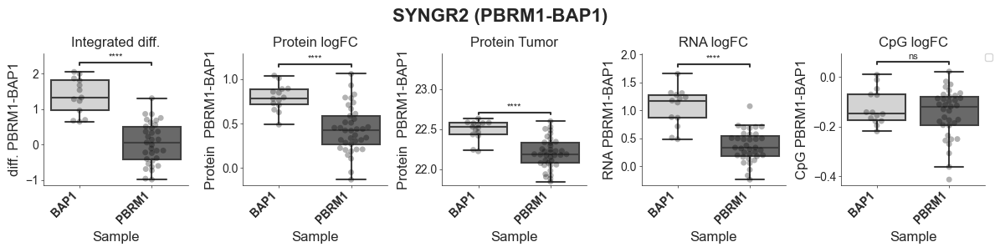

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.281e-03 U_stat=3.470e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.142e-03 U_stat=3.830e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.588e-01 U_stat=3.130e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.323e-03 U_stat=3.510e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
https://www.proteinatlas.org/ENSG00000213512-GBP7/pathology/renal+cancer/KIRC


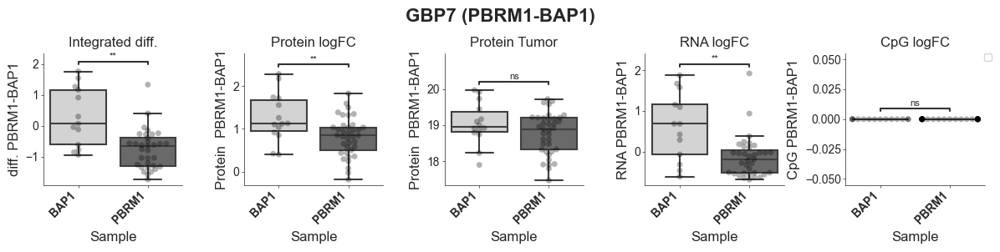

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.176e-03 U_stat=3.480e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.463e-03 U_stat=3.980e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.527e-03 U_stat=3.940e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.120e-03 U_stat=3.440e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.585e-01 U_stat=2.110e+02
https://www.proteinatlas.org/ENSG00000102699-PARP4/pathology/renal+cancer/KIRC


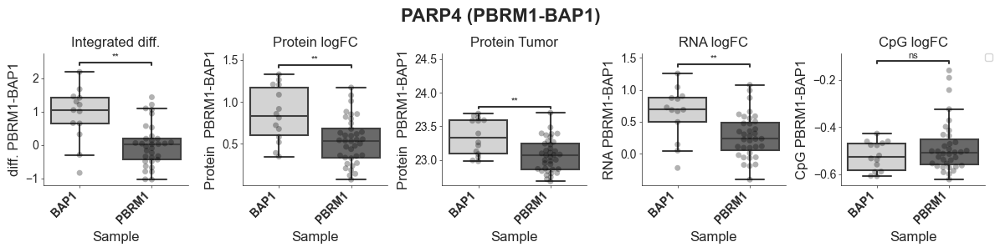

--------------------------------------------------------------------------------
                                      MDS	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.896e-04 U_stat=6.100e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.566e-02 U_stat=1.440e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.463e-03 U_stat=1.200e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.558e-04 U_stat=6.400e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.074e-02 U_stat=3.500e+02
https://www.proteinatlas.org/ENSG00000074527-NTN4/pathology/renal+cancer/KIRC


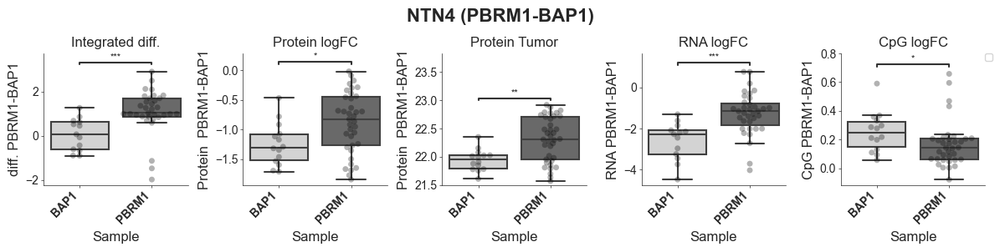

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.281e-03 U_stat=8.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.208e-01 U_stat=1.850e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.217e-02 U_stat=1.570e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.481e-03 U_stat=9.000e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.138e-01 U_stat=2.750e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


https://www.proteinatlas.org/ENSG00000139344-AMDHD1/pathology/renal+cancer/KIRC


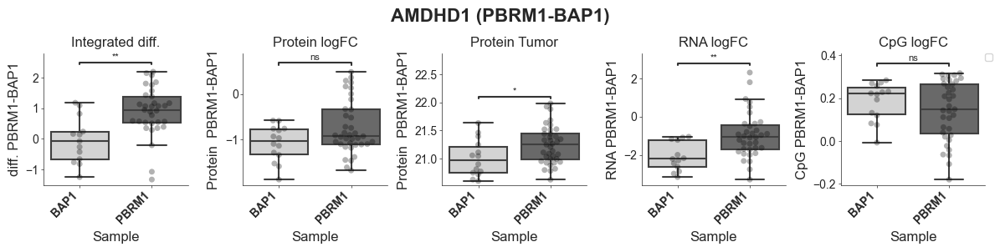

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.289e-03 U_stat=1.020e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.475e-01 U_stat=2.300e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.345e-02 U_stat=1.670e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.655e-01 U_stat=1.790e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.186e-03 U_stat=3.920e+02
https://www.proteinatlas.org/ENSG00000173598-NUDT4/pathology/renal+cancer/KIRC


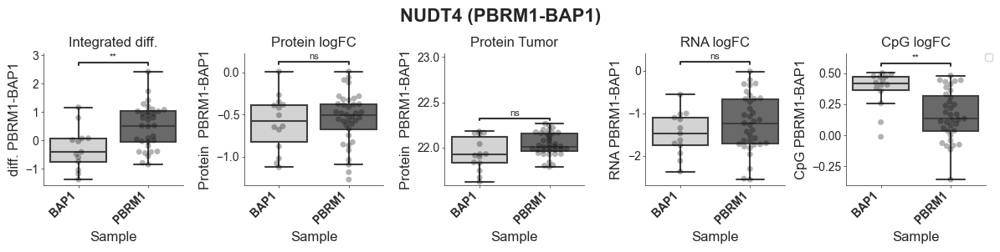

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.088e-04 U_stat=6.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.411e-01 U_stat=2.690e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.331e-01 U_stat=2.020e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.736e-03 U_stat=9.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.576e-01 U_stat=2.180e+02
https://www.proteinatlas.org/ENSG00000005108-THSD7A/pathology/renal+cancer/KIRC


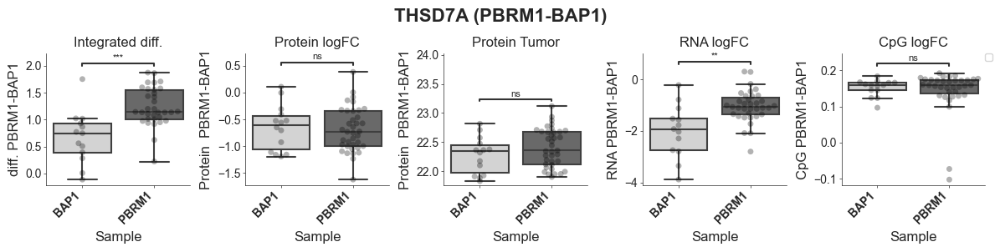

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.839e-03 U_stat=1.010e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.800e-02 U_stat=1.750e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.133e-03 U_stat=1.130e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.222e-02 U_stat=1.190e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.357e-01 U_stat=2.890e+02
https://www.proteinatlas.org/ENSG00000127955-GNAI1/pathology/renal+cancer/KIRC


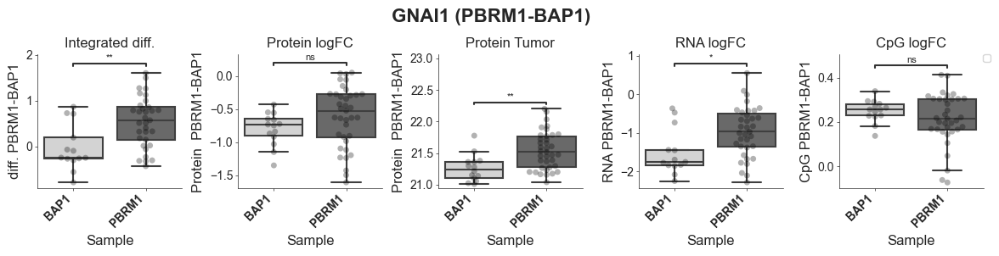

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.129e-05 U_stat=3.810e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.799e-05 U_stat=4.500e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.361e-05 U_stat=4.560e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.679e-05 U_stat=4.090e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.787e-04 U_stat=8.900e+01
https://www.proteinatlas.org/ENSG00000130413-STK33/pathology/renal+cancer/KIRC


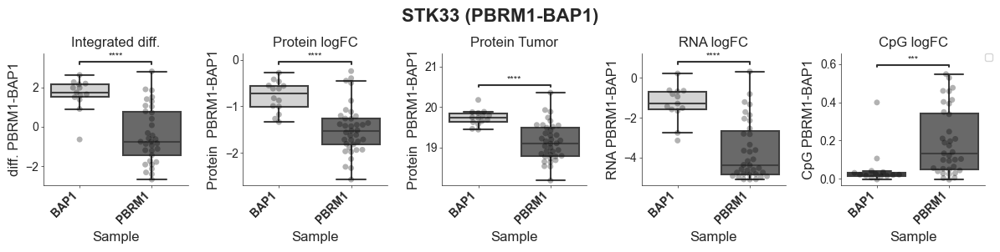

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.560e-04 U_stat=3.700e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.659e-02 U_stat=3.730e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.198e-04 U_stat=4.300e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.876e-04 U_stat=3.890e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.295e-01 U_stat=3.140e+02
https://www.proteinatlas.org/ENSG00000145626-UGT3A1/pathology/renal+cancer/KIRC


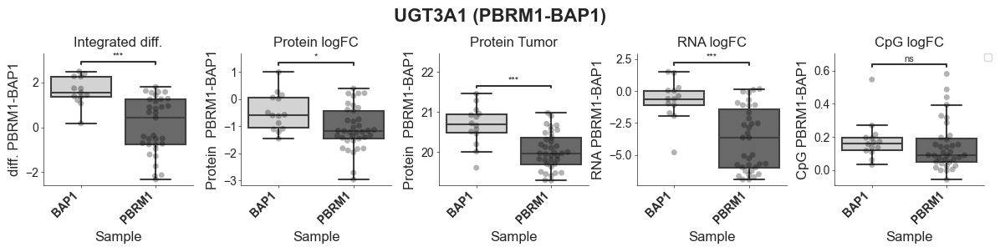

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.293e-03 U_stat=3.400e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.539e-02 U_stat=3.410e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.757e-02 U_stat=3.720e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.031e-03 U_stat=3.610e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.637e-01 U_stat=1.940e+02
https://www.proteinatlas.org/ENSG00000159166-LAD1/pathology/renal+cancer/KIRC


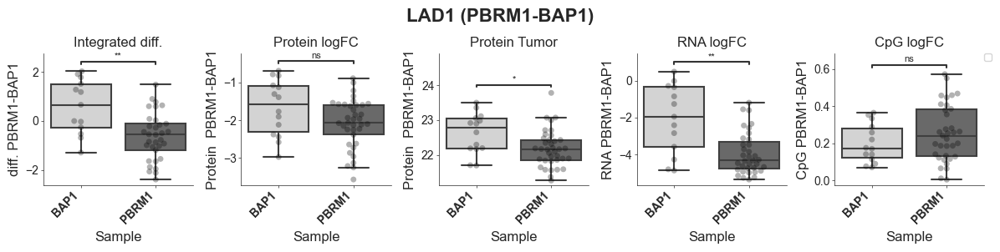

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.024e-03 U_stat=3.300e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.289e-03 U_stat=4.040e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.039e-04 U_stat=4.220e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.736e-03 U_stat=3.630e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.788e-02 U_stat=3.280e+02
https://www.proteinatlas.org/ENSG00000099812-MISP/pathology/renal+cancer/KIRC


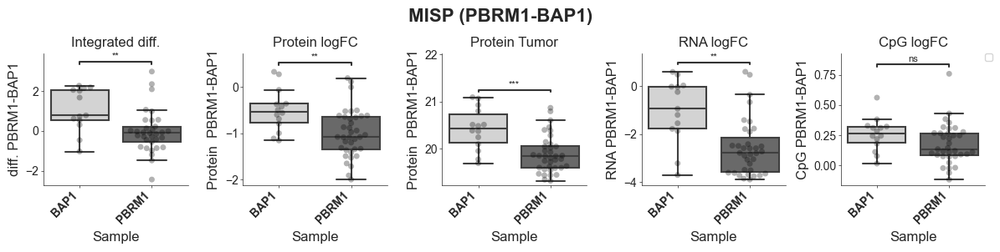

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.079e-03 U_stat=3.490e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.121e-03 U_stat=3.870e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.602e-03 U_stat=4.090e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.071e-03 U_stat=3.690e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.856e-01 U_stat=2.380e+02
https://www.proteinatlas.org/ENSG00000182795-C1orf116/pathology/renal+cancer/KIRC


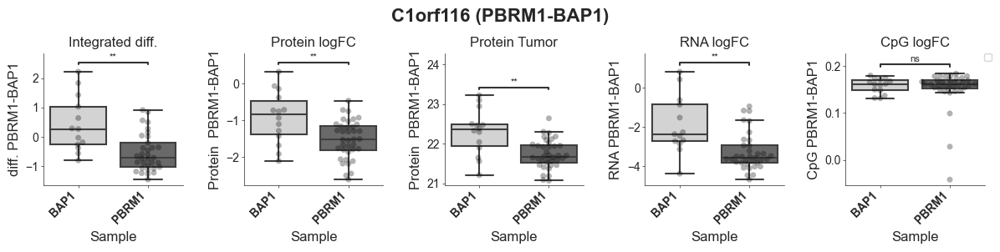

--------------------------------------------------------------------------------
                                      MDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.174e-04 U_stat=4.020e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.202e-03 U_stat=1.280e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.734e-03 U_stat=1.180e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.254e-03 U_stat=1.040e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.684e-02 U_stat=1.650e+02
https://www.proteinatlas.org/ENSG00000136231-IGF2BP3/pathology/renal+cancer/KIRC


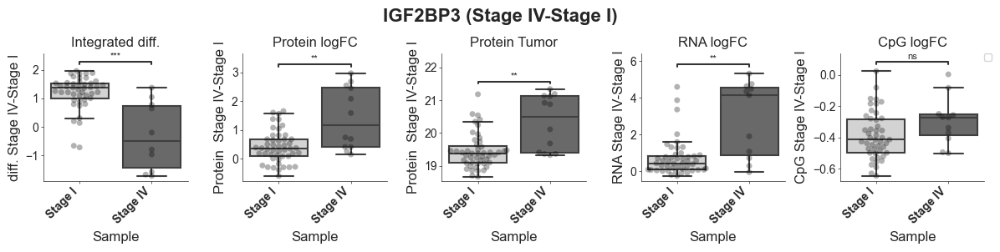

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.170e-03 U_stat=3.660e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.905e-02 U_stat=1.810e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.418e-01 U_stat=2.080e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.287e-03 U_stat=1.140e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.102e-02 U_stat=3.500e+02
https://www.proteinatlas.org/ENSG00000242515-UGT1A10/pathology/renal+cancer/KIRC


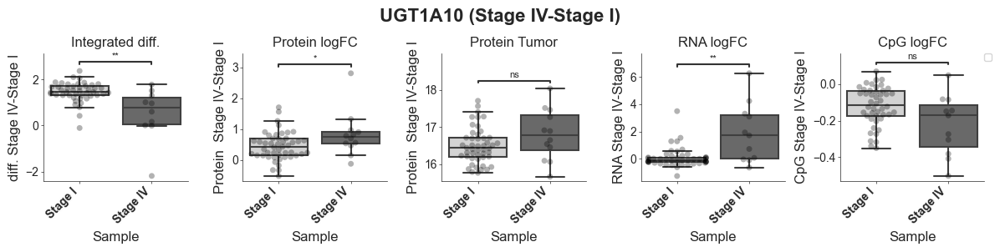

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.883e-04 U_stat=3.830e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.038e-02 U_stat=1.620e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.057e-03 U_stat=1.320e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.564e-03 U_stat=1.150e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.849e-01 U_stat=2.390e+02
https://www.proteinatlas.org/ENSG00000100097-LGALS1/pathology/renal+cancer/KIRC


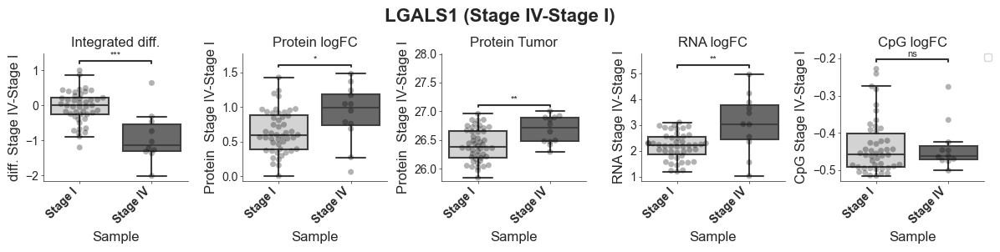

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.615e-03 U_stat=3.700e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.711e-04 U_stat=1.090e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.057e-03 U_stat=1.320e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.510e-02 U_stat=1.650e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.567e-02 U_stat=1.330e+02
https://www.proteinatlas.org/ENSG00000170231-FABP6/pathology/renal+cancer/KIRC


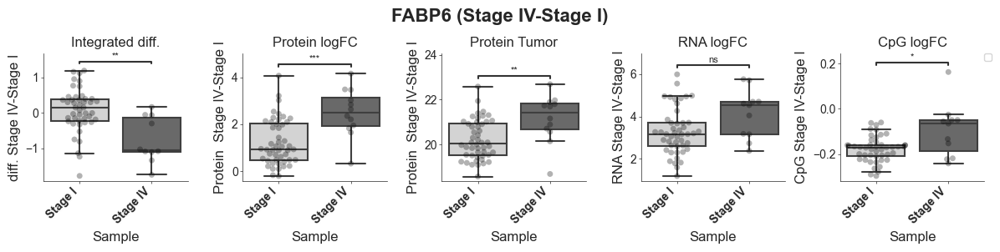

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.740e-03 U_stat=3.690e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.990e-01 U_stat=2.180e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.813e-02 U_stat=1.980e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.627e-04 U_stat=7.400e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.479e-03 U_stat=1.080e+02
https://www.proteinatlas.org/ENSG00000122884-P4HA1/pathology/renal+cancer/KIRC


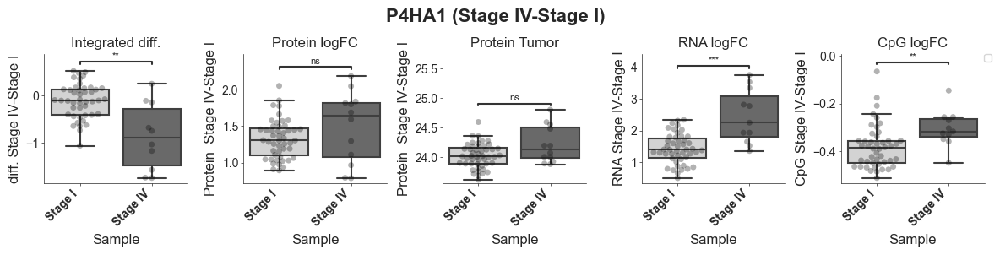

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.023e-03 U_stat=7.400e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.016e-04 U_stat=4.800e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.846e-03 U_stat=4.570e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.330e-03 U_stat=4.070e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.934e-01 U_stat=2.330e+02
https://www.proteinatlas.org/ENSG00000179403-VWA1/pathology/renal+cancer/KIRC


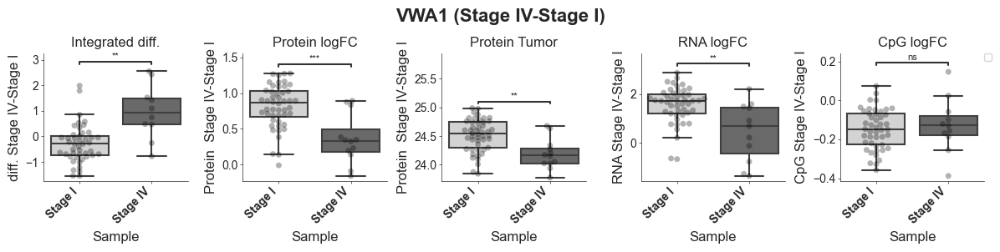

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.987e-04 U_stat=5.400e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.111e-04 U_stat=4.890e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.670e-02 U_stat=4.180e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.553e-02 U_stat=3.810e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.203e-01 U_stat=2.780e+02
https://www.proteinatlas.org/ENSG00000179144-GIMAP7/pathology/renal+cancer/KIRC


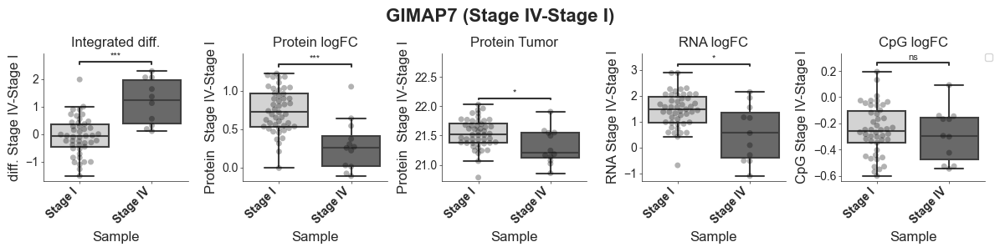

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.498e-03 U_stat=7.900e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.673e-03 U_stat=4.510e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.819e-02 U_stat=3.910e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.197e-03 U_stat=3.970e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.791e-01 U_stat=2.970e+02
https://www.proteinatlas.org/ENSG00000164116-GUCY1A1/pathology/renal+cancer/KIRC


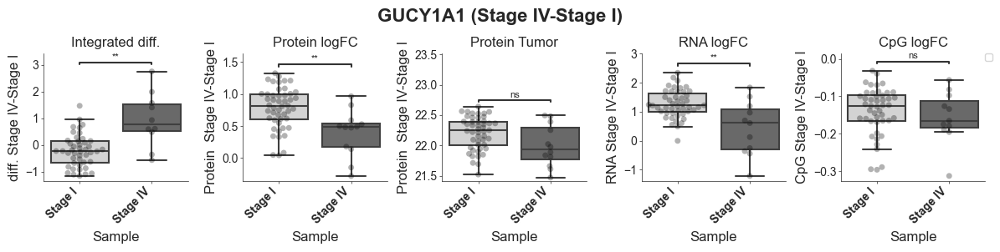

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.873e-03 U_stat=8.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.434e-02 U_stat=4.210e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.588e-02 U_stat=4.190e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.834e-03 U_stat=3.980e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.921e-01 U_stat=2.260e+02
https://www.proteinatlas.org/ENSG00000061337-LZTS1/pathology/renal+cancer/KIRC


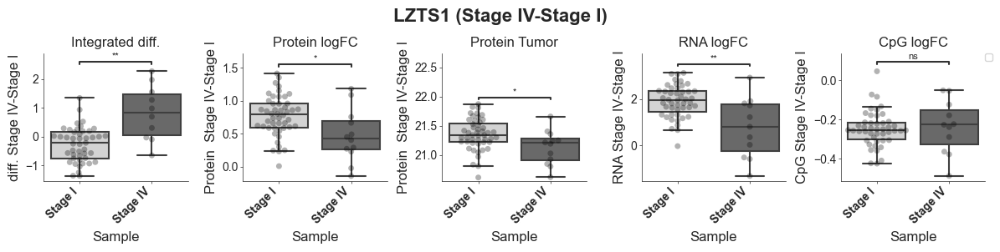

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.498e-03 U_stat=7.900e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.181e-03 U_stat=4.640e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.959e-04 U_stat=4.700e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.974e-03 U_stat=4.150e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.426e-01 U_stat=3.260e+02
https://www.proteinatlas.org/ENSG00000173269-MMRN2/pathology/renal+cancer/KIRC


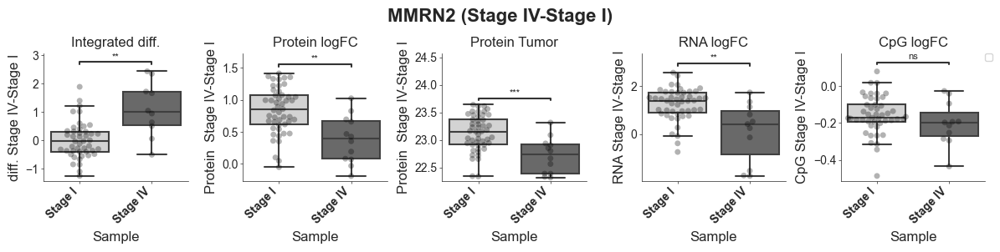

--------------------------------------------------------------------------------
                                     TPDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.911e-04 U_stat=6.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.711e-04 U_stat=1.090e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.181e-03 U_stat=1.120e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.197e-03 U_stat=1.200e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.014e-01 U_stat=2.110e+02
https://www.proteinatlas.org/ENSG00000071539-TRIP13/pathology/renal+cancer/KIRC


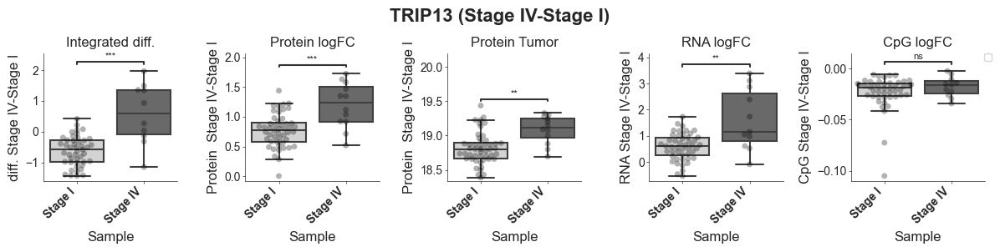

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.873e-03 U_stat=8.200e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.412e-01 U_stat=2.360e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.484e-01 U_stat=2.840e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.177e-02 U_stat=1.310e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.005e-01 U_stat=2.400e+02
https://www.proteinatlas.org/ENSG00000133488-SEC14L4/pathology/renal+cancer/KIRC


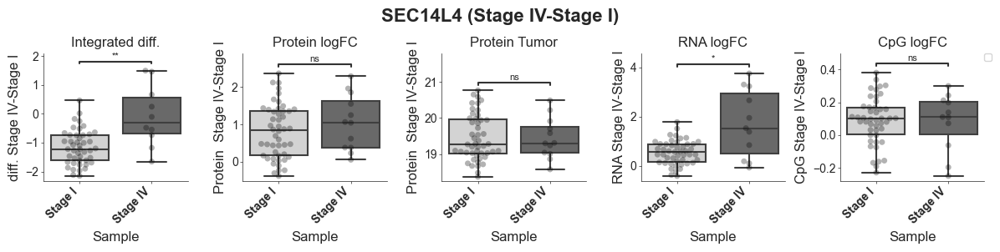

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.740e-03 U_stat=8.100e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.215e-01 U_stat=2.440e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.019e-01 U_stat=1.990e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.391e-02 U_stat=1.340e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.124e-01 U_stat=1.740e+02
https://www.proteinatlas.org/ENSG00000175063-UBE2C/pathology/renal+cancer/KIRC


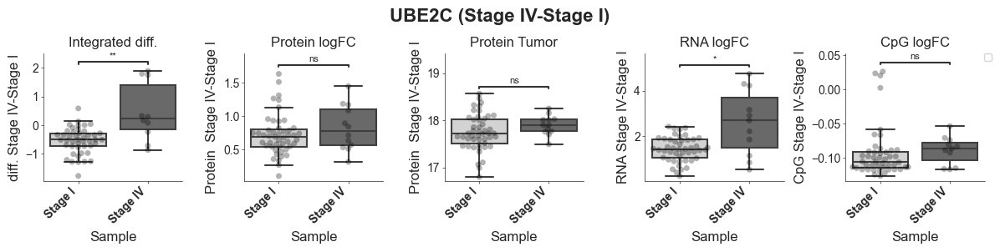

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.169e-03 U_stat=9.900e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.761e-02 U_stat=1.750e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.168e-03 U_stat=1.420e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.306e-02 U_stat=1.560e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.530e+02
https://www.proteinatlas.org/ENSG00000128335-APOL2/pathology/renal+cancer/KIRC


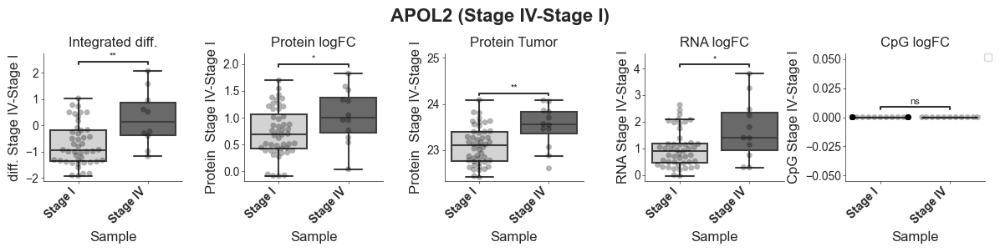

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.039e-03 U_stat=1.010e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.358e-02 U_stat=1.650e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.414e-03 U_stat=1.370e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.034e-01 U_stat=1.760e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.530e+02
https://www.proteinatlas.org/ENSG00000265190-ANXA8/pathology/renal+cancer/KIRC


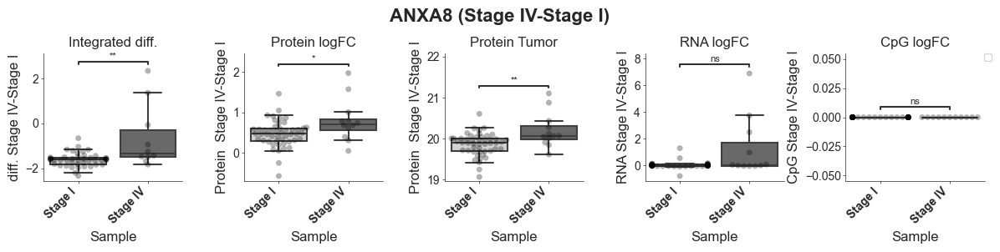

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.812e-05 U_stat=4.040e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.027e-04 U_stat=4.840e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.557e-03 U_stat=4.420e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.099e-04 U_stat=4.540e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.530e+02
https://www.proteinatlas.org/ENSG00000261371-PECAM1/pathology/renal+cancer/KIRC


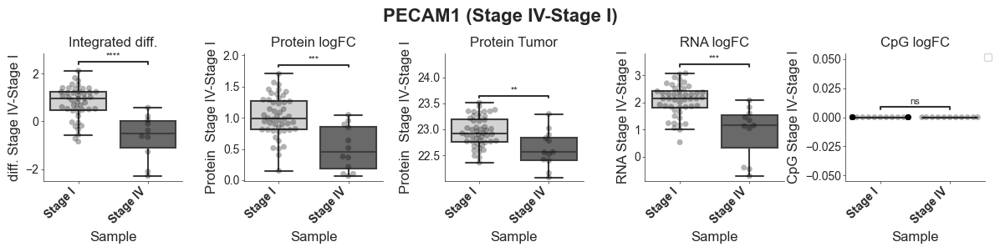

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.174e-04 U_stat=4.020e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.251e-04 U_stat=4.830e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.846e-03 U_stat=4.570e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.627e-04 U_stat=4.430e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.378e-03 U_stat=1.200e+02
https://www.proteinatlas.org/ENSG00000064989-CALCRL/pathology/renal+cancer/KIRC


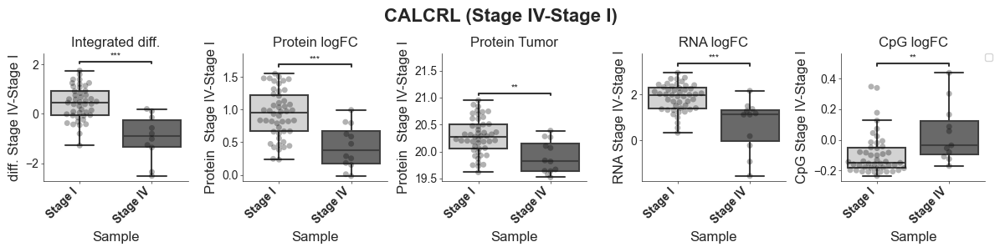

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.174e-04 U_stat=4.020e+02


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.181e-03 U_stat=4.640e+02
Protein
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.467e-04 U_stat=4.290e+02
RNA


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.530e+02
https://www.proteinatlas.org/ENSG00000176435-CLEC14A/pathology/renal+cancer/KIRC



KeyboardInterrupt



In [21]:
# Lastly, for a QC top ones done for each gene in the top/bottom 5 for each cluster.
# For each cluste pick the n largest and smallest and do teh above plots
rcm_labels = ["MDE", "TPDE", "TPDS", "TMDS", "TMDE", "MDS"]
from sciutil import SciUtil
u = SciUtil()
n = 5
comparisons = ['PBRM1-BAP1', 'Stage IV-Stage I', 'old-young']
labels = ['Mutation','Tumor Stage', 'Age']
for c_i, comparison in enumerate(comparisons):
    
    for r in rcm_labels:
        u.dp([r])
        r_df = vae_rcm_df[vae_rcm_df['Regulation_Grouping_2'] == r]
        # Filter to just significant
        vae_change = f'Integrated diff ({comparison})'
        vae_p = f'Integrated padj ({comparison})'
        cond1 = comparison.split('-')[0]
        cond0 = comparison.split('-')[1]

        r_df = r_df[r_df[vae_p] <= 0.05]

        top_df = r_df[r_df[vae_change] > 0]
        bot_df = r_df[r_df[vae_change] < 0]

        top_df = top_df.nlargest(n, vae_change)

        bot_df = bot_df.nsmallest(n, vae_change) 
        # For each of the IDs pop it through
        u.warn_p(['Top 5'])
        for ensembl_id in top_df.index.values:
            gene_name = ens_to_gene[ensembl_id] # Easier to use the gene name for display
            plot_gene_logfcs(ensembl_id, cond0, cond1, x=labels[c_i])
        u.warn_p(['Bottom 5'])
        for ensembl_id in bot_df.index.values:
            gene_name = ens_to_gene[ensembl_id] # Easier to use the gene name for display
            plot_gene_logfcs(ensembl_id, cond0, cond1, x=labels[c_i])

## Perform GSEA using fGSEA

We need to save in the correct format and the re-read all in and save as a summary file (since it otherwise takes too long to look at every file).


```

conds = c('Stage1-Stage4',  'young-old', 'PBRM1-Female', 'middle-old',  'Random0.1-Random1.1', 'Random0.2-Random1.2', 'Random0.3-Random1.3', 'Random0.4-Random1.4')

for (cases_conds in conds) {
  for (r in reg_grps) {
    sircleFileName <- paste0('../data/S050_CCRCC_Clark_Cell2019/sircle/all_patients/all_cpgs/Integration/output_data/GSEA/', r, '-IntegrationModel-stats-',cases_conds ,'-.csv')
    # https://bmcbioinformatics.biomedcentral.com/articles/10.1186/1471-2105-11-587
    vis_df <- read.csv(sircleFileName)
    
    # Run GSEA on the consistently changed genes between late and early stage using the t-stat as the rank
    GSEA_results <- GSEASetupSircle(vis_df, paste0(cases_conds, " ", r), gene_name="hgnc_symbol", stat='diff',   GSEA_file_dir=GSEA_file_dir, output_dir='../data/S050_CCRCC_Clark_Cell2019/sircle/all_patients/all_cpgs/Integration/output_data/GSEA/', pathway_list=pathway_list)
  }

}
```

https://www.nature.com/articles/s41581-020-00359-2/figures/6

In [22]:
gsea_dir = f'{output_dir}Integrated_fGSEA/fGSEA/' #output_dir = f'{base_dir}sircle/F6_integrative_comparisons/'


NameError: name 'gsea_dir' is not defined

## Consolidate GSEA into single file for supps

In [24]:
import os
from sciutil import SciUtil
u = SciUtil()
rcm_labels = ["MDS", "MDS_TMDE", "MDE", "MDE_TMDS", "TMDE", "TMDS", "TPDE", "TPDE_TMDS",  "TPDS", "TPDS_TMDE"]

files = os.listdir(f'{output_dir}Integrated_fGSEA/fGSEA/')
# Read through each one and print out each of the various
# Read through each one and print out each of the various
comparisons = ['PBRM1-BAP1', 'Stage IV-Stage I', 'old-young']
comp_map = {'mutation': 'PBRM1-BAP1', 'S4-S1': 'Stage IV-Stage I', 'age': 'old-young'}
for comp in comparisons:
    with open( f'{output_dir}Integrated_fGSEA/{comp}_consolidated_metabolic_GSEA.tsv', 'w+') as fout:
        fout.write(f'Comparison\tRegulation_Grouping_2\tPathway\t fGSEA NES\t fGSEA padj\t fGSEA pval \t fGSEA size\n')
        for f in files:
            if comp == 'Stage IV-Stage I':
                f_name = f.replace('Stage_IV-Stage_I', 'Stage IV-Stage I')
            else:
                f_name = f
            f_name = '_'.join(f_name.split('_')[1:])
            if 'MetabolicPathways.csv' in f_name and comp == f_name.split('_')[0]:
                f_s = f_name.split('_')
                if f_s[1] in rcm_labels:
                    if f_s[2] == 'GSEA':
                        reg_label = f_s[1]
                    else:
                        reg_label = f_s[1] + '&' + f_s[2]
                    gsea = pd.read_csv(f'{output_dir}Integrated_fGSEA/fGSEA/{f}')
                    sig_gsea = gsea
                    # Make sure the size is > 3
                    sig_gsea = sig_gsea.sort_values(by='NES')
                    for i, g in enumerate(sig_gsea['pathway'].values):
                        fout.write(f'{comp}\t{reg_label}\t{g}\t{sig_gsea["NES"].values[i]}\t{sig_gsea["padj"].values[i]}\t{sig_gsea["pval"].values[i]}\t{sig_gsea["size"].values[i]}\n')
